# <b><u> Project Title : Seoul Bike Sharing Demand Prediction </u></b>

## <b> Problem Description </b>

### Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.


# **Data Description**

<b> The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.</b>


   <b>Attribute Information: </b>

* ### Date : year-month-day
* ### Rented Bike count - Count of bikes rented at each hour
* ### Hour - Hour of he day
* ### Temperature-Temperature in Celsius
* ### Humidity - %
* ### Windspeed - m/s
* ### Visibility - 10m
* ### Dew point temperature - Celsius
* ### Solar radiation - MJ/m2
* ### Rainfall - mm
* ### Snowfall - cm
* ### Seasons - Winter, Spring, Summer, Autumn
* ### Holiday - Holiday/No holiday
* ### Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)

# **Importing**

In [ ]:
# Importing the libraries
import numpy as np
import pandas as pd
from numpy import math
from numpy import loadtxt
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from datetime import datetime
import datetime as dt

from scipy.stats import uniform
from scipy.stats import norm
from scipy.stats import chi2
from scipy.stats import t
from scipy.stats import f

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MultiLabelBinarizer


from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_graphviz
from graphviz import Source

from IPython.display import SVG
from IPython.display import display


from sklearn.model_selection import cross_validate
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import RandomizedSearchCV


from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc
from sklearn.metrics import log_loss
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve



from sklearn import ensemble
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import AdaBoostRegressor




from xgboost import XGBClassifier
from xgboost import XGBRegressor
from xgboost import XGBRFClassifier
from xgboost import XGBRFRegressor



from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor






import statsmodels.api as sm


import warnings
warnings.filterwarnings('ignore')



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Importing the dataset
dataset = pd.read_csv('/content/drive/MyDrive/Bike Sharing Demand Prediction - Capstone Project/SeoulBikeData.csv',encoding= 'unicode_escape')

In [ ]:
dataset.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


# **Data Inspection**

In [ ]:
# First look
dataset.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [ ]:
# Changing pickup_datetime & dropoff_datetime from object to Datetime format

format_string = "%d/%m/%Y"

dataset['Date'] = dataset['Date'].apply(lambda x: 
                                    dt.datetime.strptime(x,format_string))


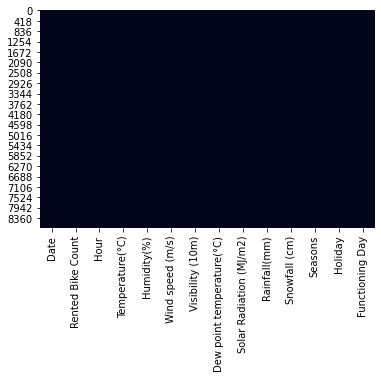

In [ ]:
# Checking Null Value by plotting Heatmap
sns.heatmap(dataset.isnull(), cbar=False)

***Above dataset has no null value.***

# **DataSet Information**

In [ ]:
dataset['year'] = dataset['Date'].dt.year
dataset['month'] = dataset['Date'].dt.month
dataset['day'] = dataset['Date'].dt.day

In [ ]:
print("Columns and data types")
pd.DataFrame(dataset.dtypes).rename(columns = {0:'dtype'})

Columns and data types


,dtype
Date,datetime64[ns]
Rented Bike Count,int64
Hour,int64
Temperature(°C),float64
Humidity(%),int64
Wind speed (m/s),float64
Visibility (10m),int64
Dew point temperature(°C),float64
Solar Radiation (MJ/m2),float64
Rainfall(mm),float64


In [ ]:
dataset.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day', 'year', 'month', 'day'],
      dtype='object')

In [ ]:
dataset.shape

(8760, 17)

In [ ]:
dataset.describe(include='all')

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,year,month,day
count,8760,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760,8760,8760,8760.000000,8760.000000,8760.000000
unique,365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2,2,NaN,NaN,NaN
top,2018-05-21 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,No Holiday,Yes,NaN,NaN,NaN
freq,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2208,8328,8465,NaN,NaN,NaN
first,2017-12-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2018-11-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,NaN,NaN,NaN,2017.915068,6.526027,15.720548
std,NaN,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,NaN,NaN,NaN,0.278796,3.448048,8.796749
min,NaN,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,NaN,NaN,NaN,2017.000000,1.000000,1.000000
25%,NaN,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,NaN,NaN,NaN,2018.000000,4.000000,8.000000


In [ ]:
numerical_columns=list(dataset.select_dtypes(['int64','float64']).columns)
numerical_features=pd.Index(numerical_columns)
numerical_features

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'year',
       'month', 'day'],
      dtype='object')

In [ ]:
categorical_columns=list(dataset.select_dtypes(['object']).columns)
categorical_features=pd.Index(categorical_columns)
categorical_features

Index(['Seasons', 'Holiday', 'Functioning Day'], dtype='object')

In [ ]:
def unique_name_no(col):
  print(dataset[col].unique())
  print(dataset[col].nunique())


for i in categorical_columns:
  print(i.upper())
  unique_name_no(i)

SEASONS
['Winter' 'Spring' 'Summer' 'Autumn']
4
HOLIDAY
['No Holiday' 'Holiday']
2
FUNCTIONING DAY
['Yes' 'No']
2


In [ ]:
# duplicate
len(dataset[dataset.duplicated()])

0

In [ ]:
dataset[dataset.duplicated()]

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,year,month,day


In [ ]:
### Dropping Duplicate Rows
dataset=dataset.drop_duplicates()
len(dataset[dataset.duplicated()])

0

In [ ]:
dataset.shape

(8760, 17)

In [ ]:
dataset.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
year                         0
month                        0
day                          0
dtype: int64

***There are 8760 rows and 14 columns in above dataset.***

***Above dataset has no missing value.***

***Above dataset has no duplicate value.***

***Above dataset has no null value.***

# **Exploratory Data Analysis**

## **Column wise Analysis**

In [ ]:
def column_wise_analysis(dataset,column):
  print(str(column).upper())
  print(" ")
  print(dataset[column].value_counts().head())
  print(" ")
  print(dataset[column].nunique())
  print(" ")
  print(dataset.groupby([column])['Rented Bike Count'].mean().sort_values(ascending = False).head(10))
  print(" ")

  import matplotlib.pyplot as plt
  from matplotlib import rcParams
  import seaborn as sns
  s1=dataset[column].unique()
  s2=dataset.groupby([column])['Rented Bike Count'].mean()

  plt.rcParams['figure.figsize'] = (18, 7)

  sns.scatterplot(s1,s2,color='r')

  plt.xlabel(column, fontsize = 15)
  plt.ylabel('Rented Bike Count', fontsize = 15)
  plt.show()

  print(" ")
  print(" ")
  print(" ")


  import matplotlib.pyplot as plt
  from matplotlib import rcParams
  plt.rcParams['figure.figsize'] = (12, 7)

  color = plt.cm.copper(np.linspace(0, 0.5, 20))
  ((dataset.groupby([column])['Rented Bike Count'].mean())).sort_values(ascending = False).head(6).plot.bar(color = ['violet','indigo','b','g','y','orange','r'])

  plt.xlabel(column, fontsize = 15)
  plt.ylabel('Rented Bike Count', fontsize = 15)
  plt.show()

  print(" ")
  print(" ")
  print(" ")


  cc=dataset.groupby([column])['Rented Bike Count'].mean()
  plt.rcParams['figure.figsize'] = (12, 7)
  plt.bar(dataset[column].unique(),cc) 

  # Box Plot for Account Length attribute 
  dataset.boxplot(column=column,by='Rented Bike Count')


**Exploring the dependent variable**

In [ ]:
dataset.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,year,month,day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1


In [ ]:
dataset['Rented Bike Count'].value_counts()

0       295
122      19
223      19
262      19
103      18
       ... 
2379      1
1589      1
1597      1
1605      1
2047      1
Name: Rented Bike Count, Length: 2166, dtype: int64

RENTED BIKE COUNT
 
0      295
122     19
223     19
262     19
103     18
Name: Rented Bike Count, dtype: int64
 
2166
 
Rented Bike Count
3556    3556
3418    3418
3404    3404
3384    3384
3380    3380
3365    3365
3309    3309
3298    3298
3277    3277
3256    3256
Name: Rented Bike Count, dtype: int64
 


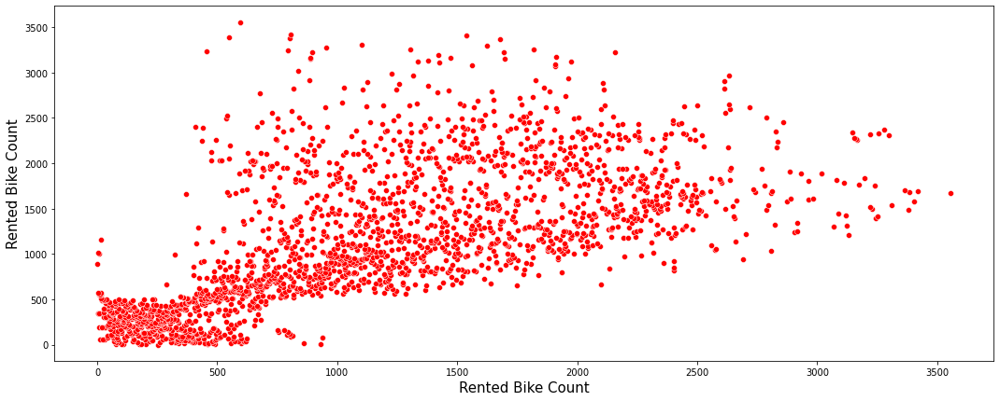

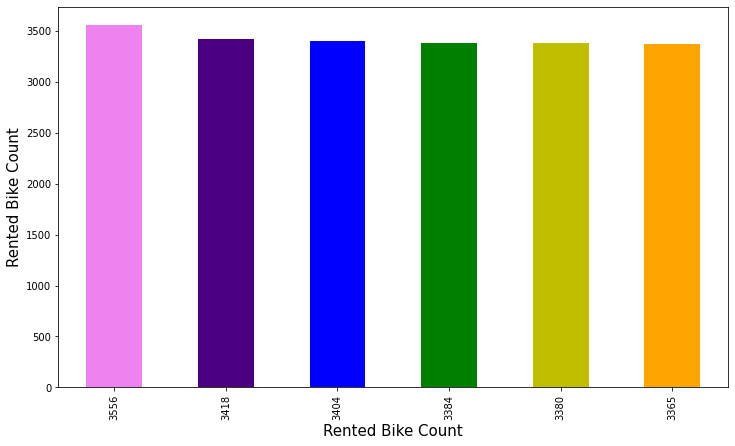

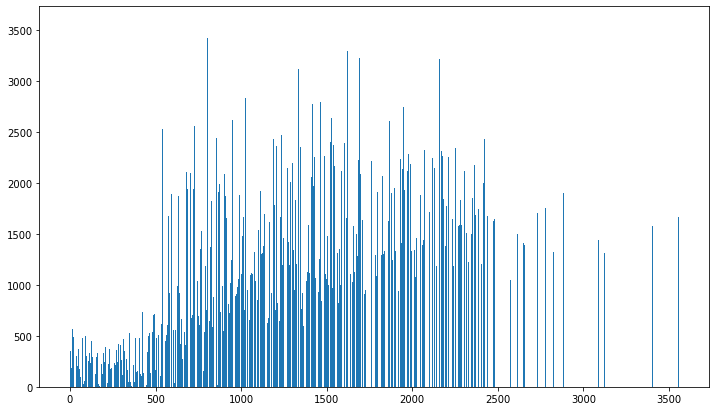

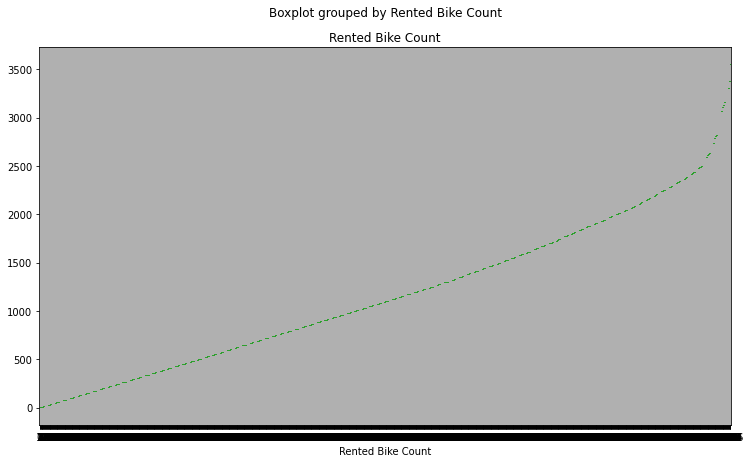

In [ ]:
column_wise_analysis(dataset,'Rented Bike Count')

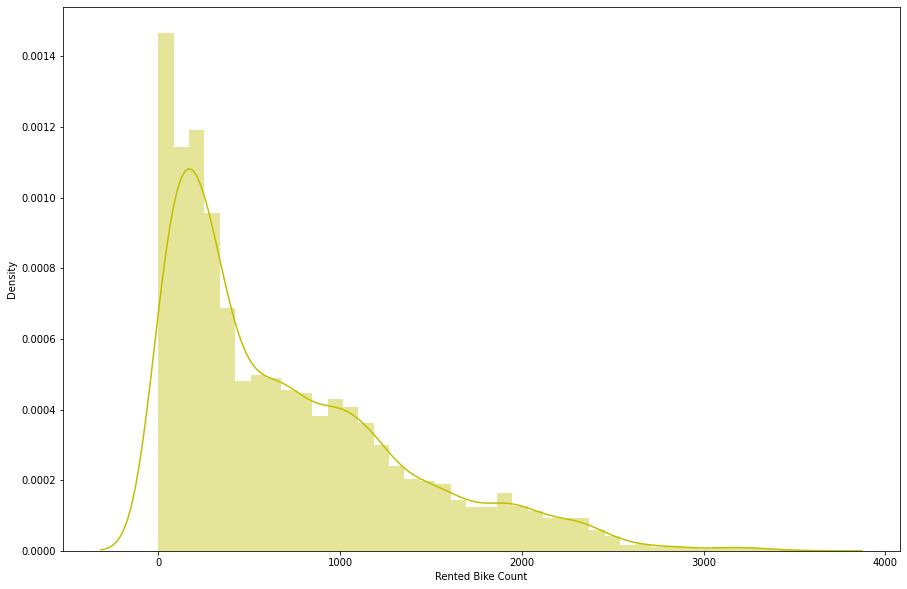

In [ ]:
# Dependent Variable "'Rented Bike Count'"
plt.figure(figsize=(15,10))
sns.distplot(dataset['Rented Bike Count'], color="y")

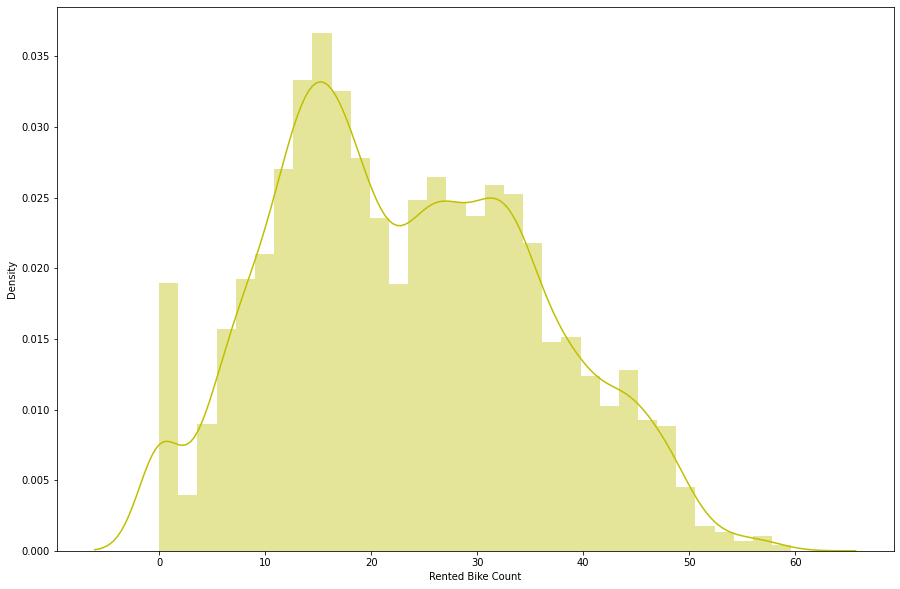

In [ ]:
# Dependent Variable "'Rented Bike Count'"
plt.figure(figsize=(15,10))
sns.distplot(np.sqrt(dataset['Rented Bike Count']), color="y")

**Exploring Independent Variable**

HOUR
 
23    365
15    365
8     365
16    365
1     365
Name: Hour, dtype: int64
 
24
 
Hour
18    1502.926027
19    1195.147945
17    1138.509589
20    1068.964384
21    1031.449315
8     1015.701370
16     930.621918
22     922.797260
15     829.186301
14     758.824658
Name: Rented Bike Count, dtype: float64
 


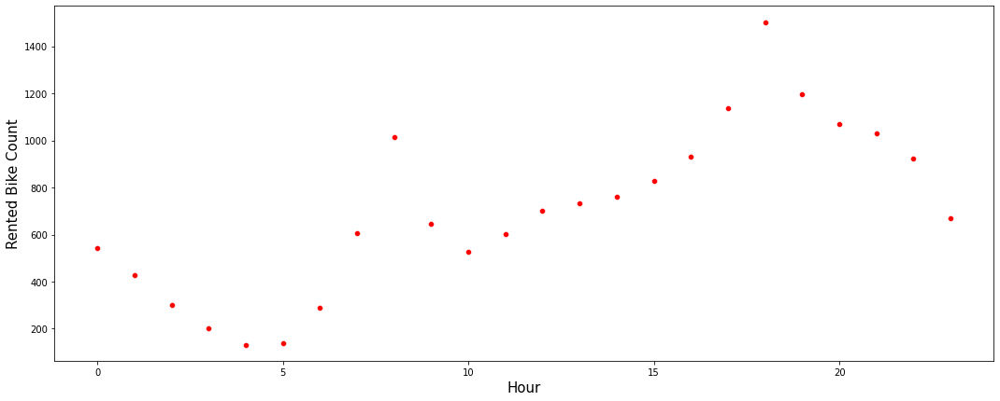

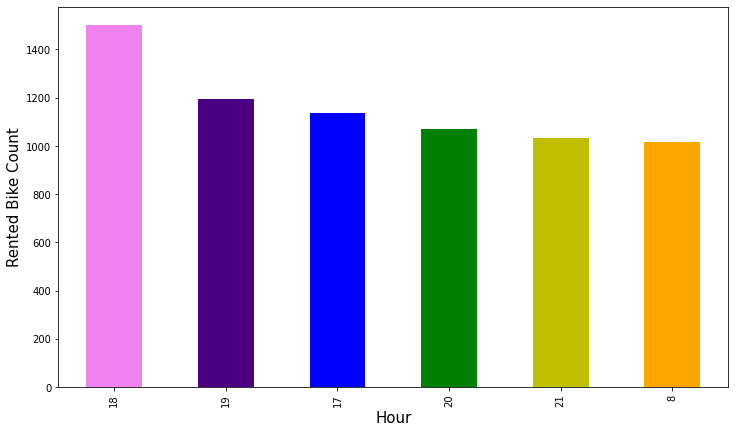

 
 
 
TEMPERATURE(°C)
 
19.1    40
20.5    40
23.4    39
7.6     38
20.7    38
Name: Temperature(°C), dtype: int64
 
546
 
Temperature(°C)
32.2    1692.875000
32.5    1638.000000
30.3    1579.750000
35.2    1558.333333
26.6    1552.650000
27.1    1524.250000
34.6    1513.000000
30.9    1488.125000
33.9    1479.142857
32.3    1458.800000
Name: Rented Bike Count, dtype: float64
 


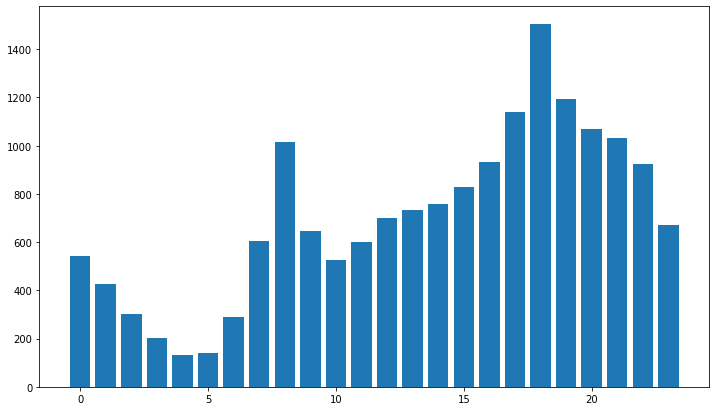

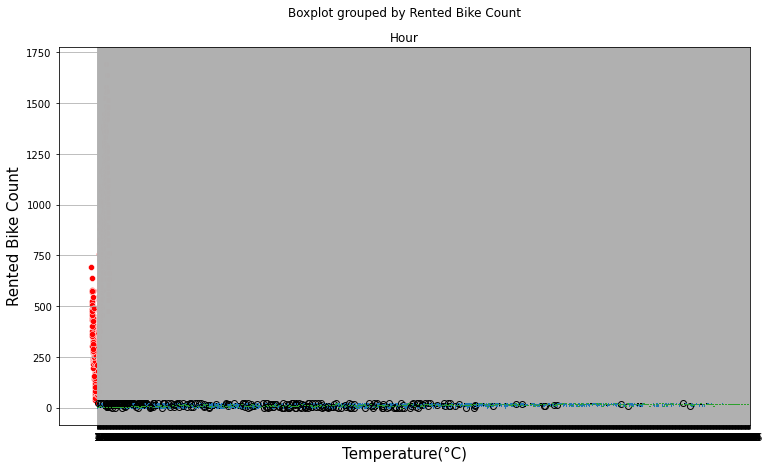

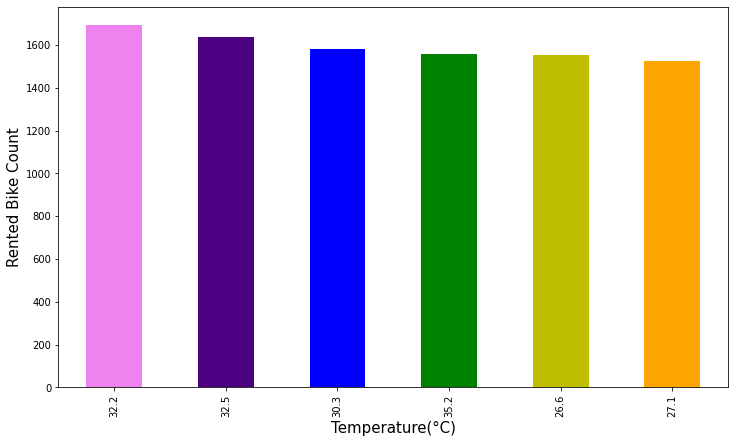

 
 
 
HUMIDITY(%)
 
97    173
53    173
43    164
57    159
56    157
Name: Humidity(%), dtype: int64
 
90
 
Humidity(%)
12    2032.000000
11    1986.000000
13    1451.000000
10    1315.000000
48     965.284553
46     898.299213
55     891.310345
45     888.971831
24     887.744186
47     885.288462
Name: Rented Bike Count, dtype: float64
 


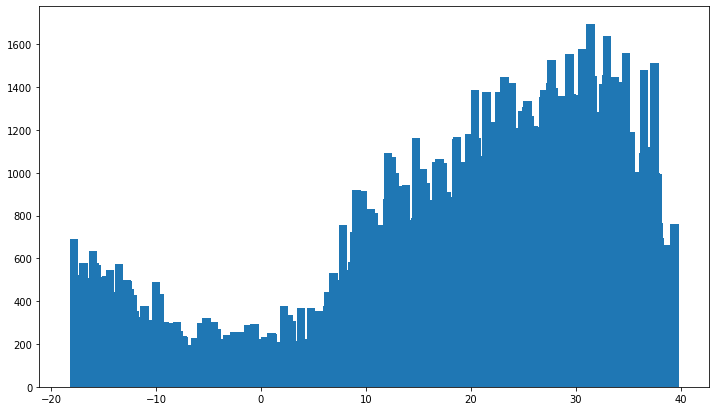

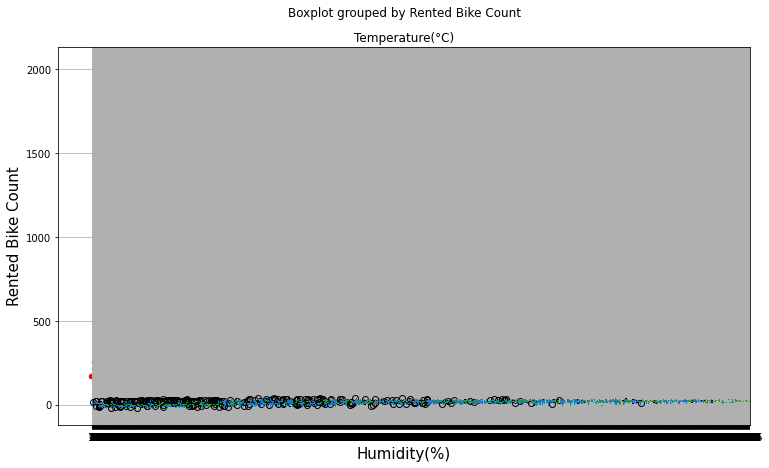

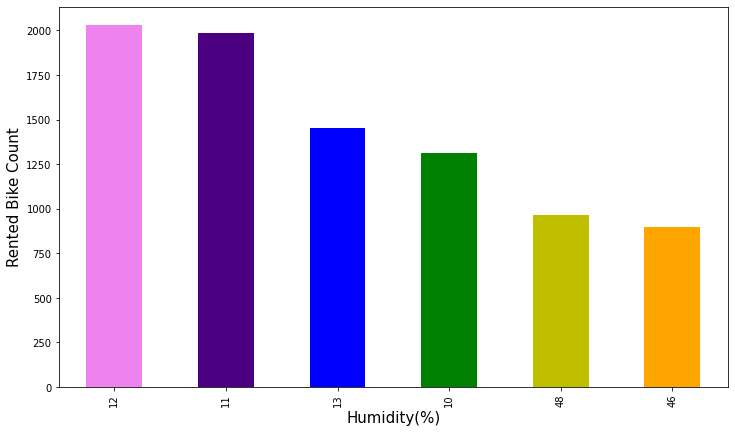

 
 
 
WIND SPEED (M/S)
 
1.1    420
1.2    403
1.0    388
0.9    388
0.8    385
Name: Wind speed (m/s), dtype: int64
 
65
 
Wind speed (m/s)
7.2    1805.000000
5.7    1176.000000
3.1     984.459677
2.8     928.056604
7.4     913.000000
3.6     906.327586
3.3     892.020000
2.4     891.678756
2.6     891.044199
2.7     869.283019
Name: Rented Bike Count, dtype: float64
 


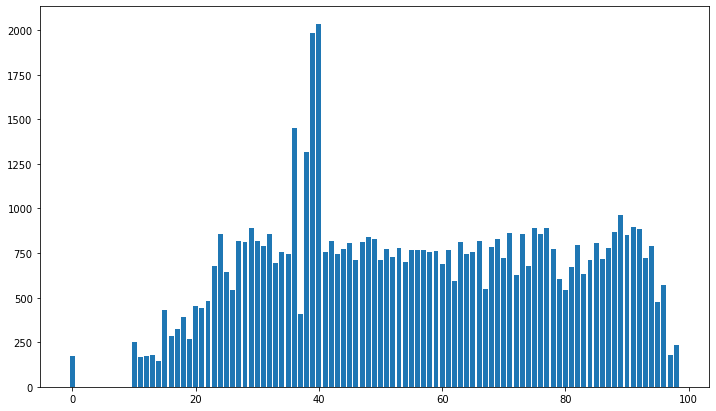

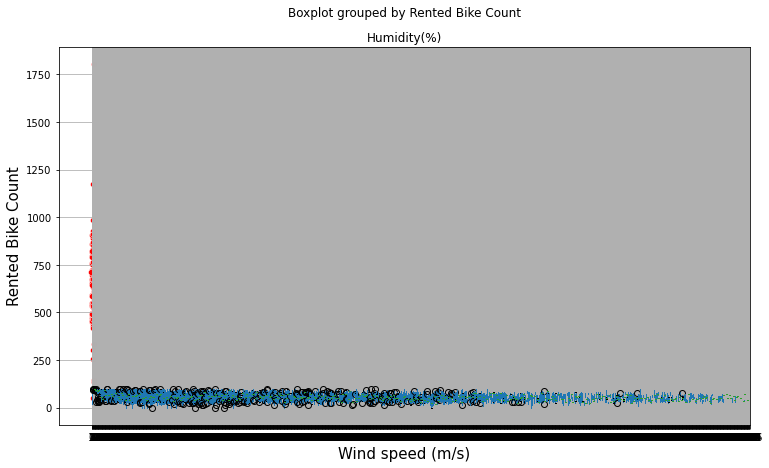

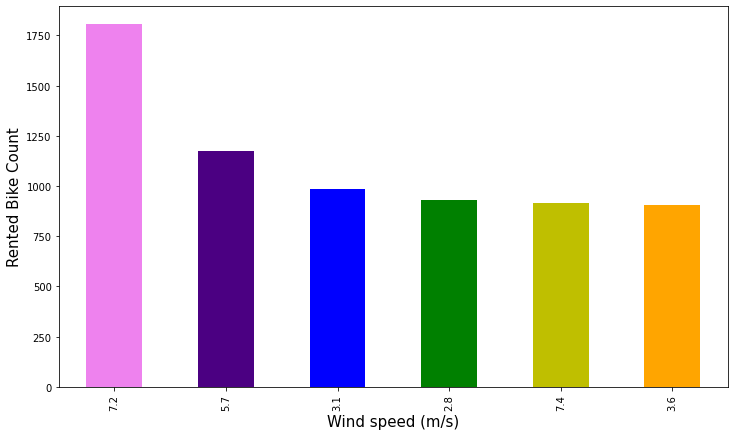

 
 
 
VISIBILITY (10M)
 
2000    2245
1995      34
1999      28
1985      28
1989      28
Name: Visibility (10m), dtype: int64
 
1789
 
Visibility (10m)
1225    2481.0
1245    2479.0
1152    2474.0
964     2456.0
566     2440.0
1886    2405.0
857     2379.0
1109    2276.0
1063    2248.0
1069    2211.0
Name: Rented Bike Count, dtype: float64
 


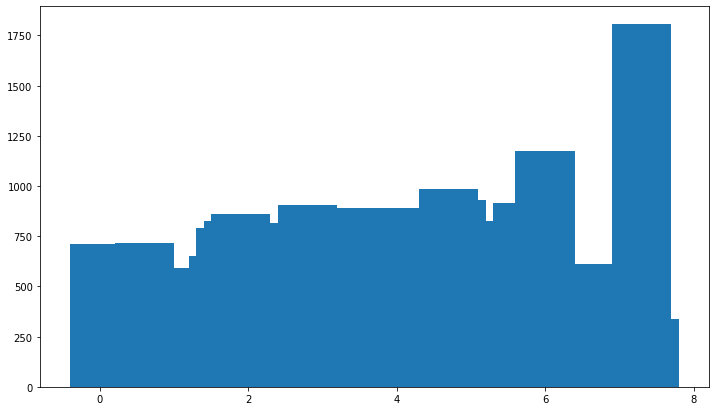

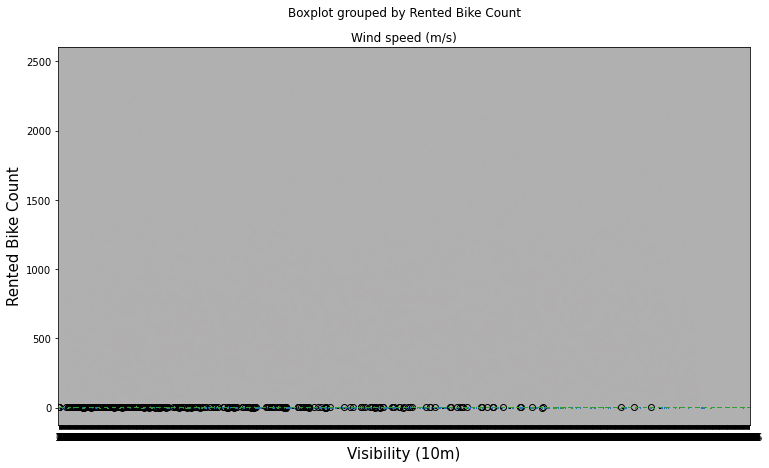

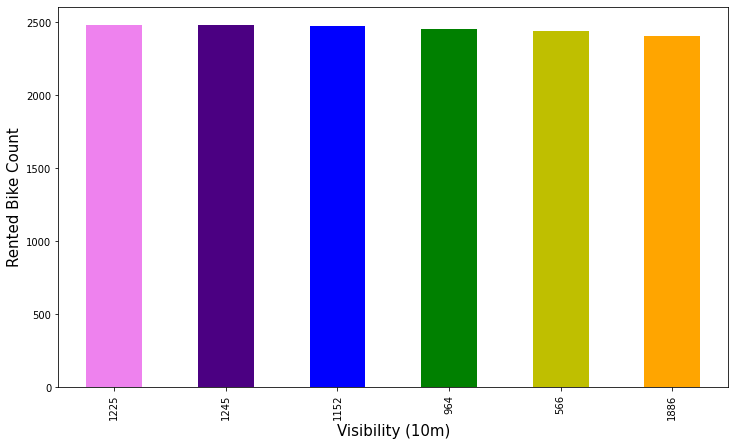

 
 
 
DEW POINT TEMPERATURE(°C)
 
0.0     60
21.1    43
21.2    40
14.3    40
8.9     39
Name: Dew point temperature(°C), dtype: int64
 
556
 
Dew point temperature(°C)
12.6    1699.235294
25.9    1553.000000
17.1    1534.363636
16.9    1449.666667
11.9    1366.933333
17.5    1358.000000
12.7    1350.608696
15.7    1347.000000
25.7    1337.000000
14.4    1313.916667
Name: Rented Bike Count, dtype: float64
 


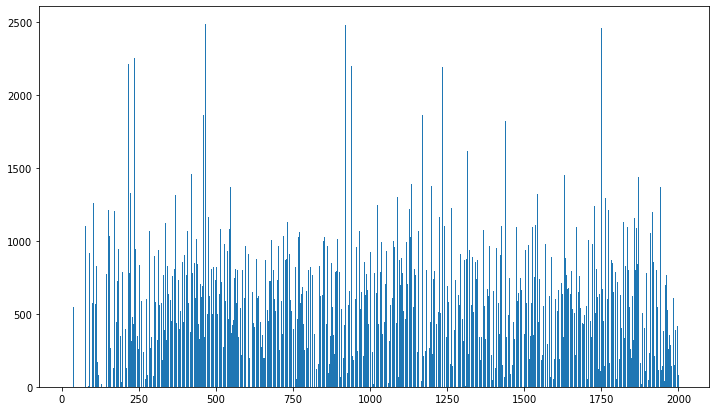

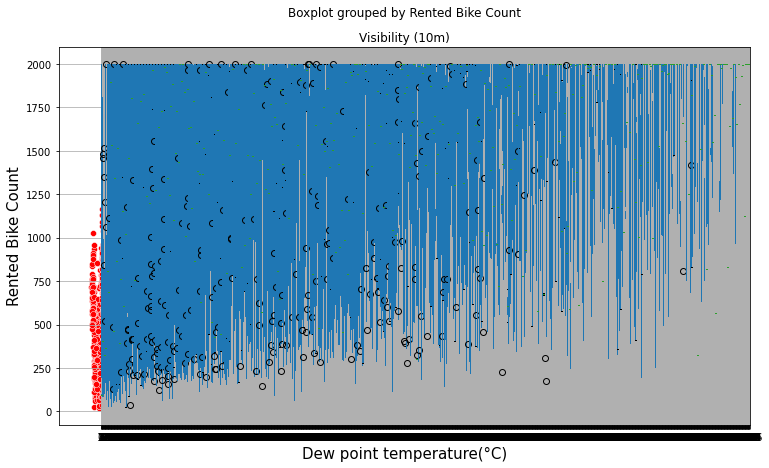

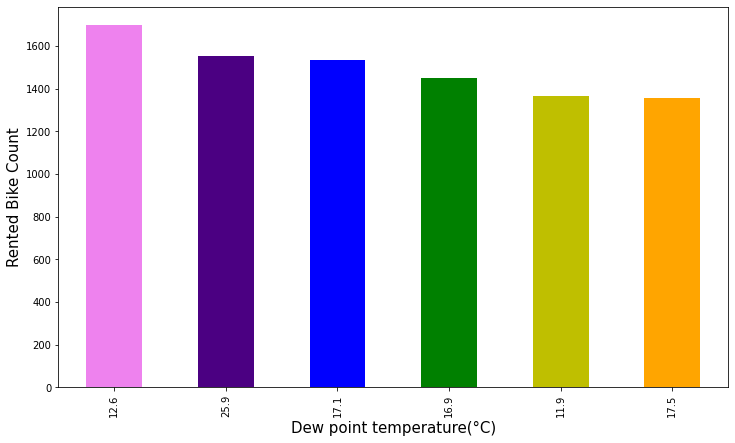

 
 
 
SOLAR RADIATION (MJ/M2)
 
0.00    4300
0.01     128
0.02      82
0.03      69
0.06      61
Name: Solar Radiation (MJ/m2), dtype: int64
 
345
 
Solar Radiation (MJ/m2)
3.35    1635.000000
3.39    1574.333333
3.52    1516.000000
1.23    1482.500000
3.07    1476.666667
1.27    1459.125000
3.49    1456.000000
1.90    1415.142857
1.21    1375.600000
2.64    1360.000000
Name: Rented Bike Count, dtype: float64
 


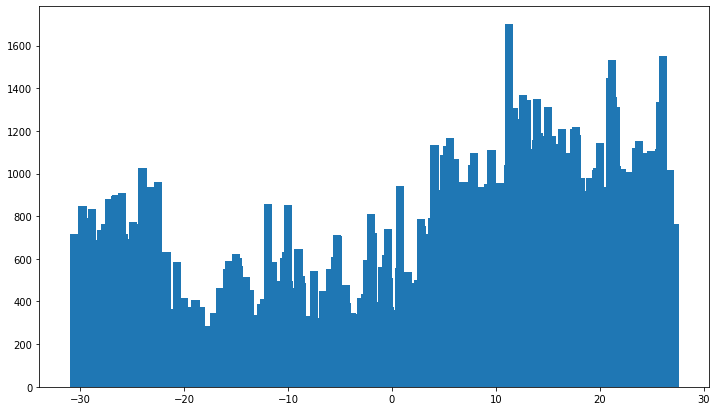

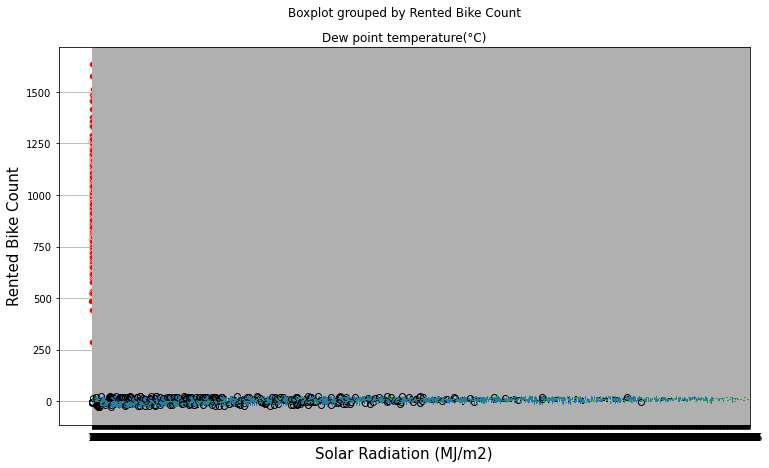

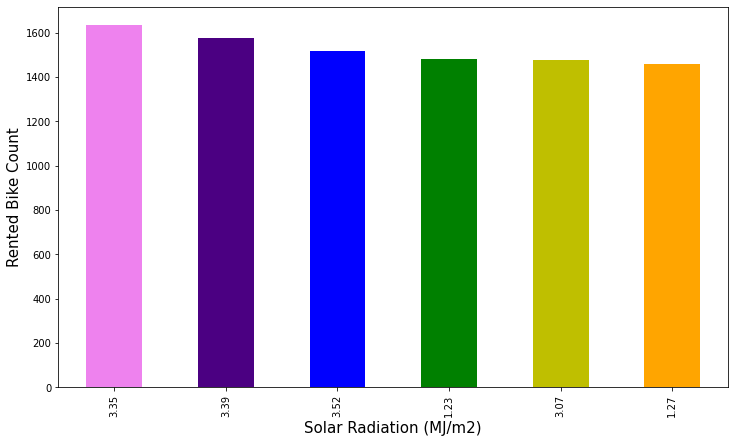

 
 
 
RAINFALL(MM)
 
0.0    8232
0.5     116
1.0      66
1.5      56
0.1      46
Name: Rainfall(mm), dtype: int64
 
61
 
Rainfall(mm)
1.3     764.000000
0.0     739.311103
21.5    596.000000
0.9     489.333333
7.3     468.000000
6.4     430.500000
1.1     401.000000
0.1     329.978261
0.5     246.586207
4.0     223.428571
Name: Rented Bike Count, dtype: float64
 


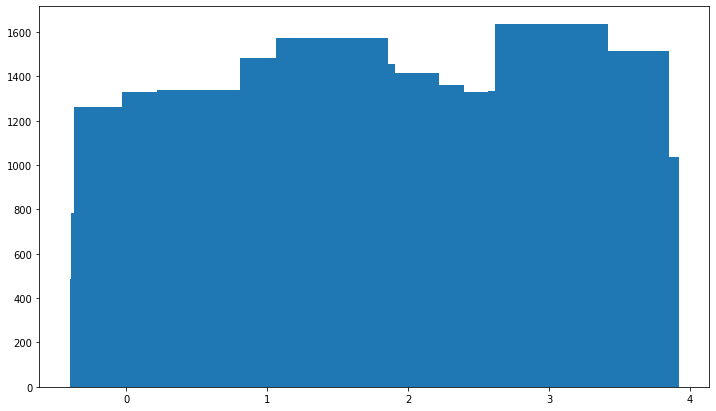

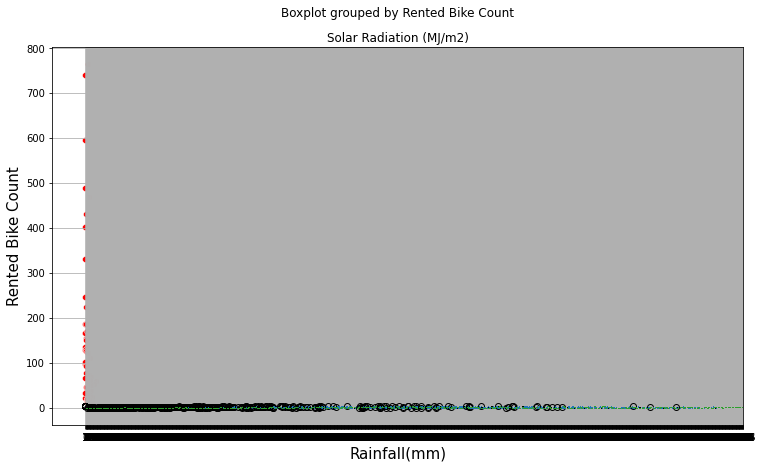

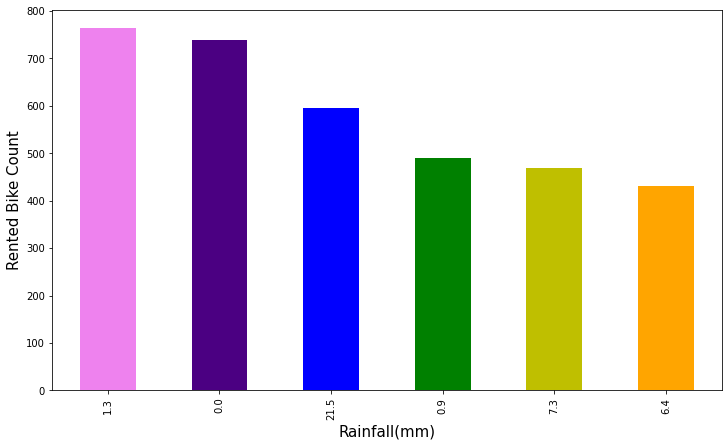

 
 
 
SNOWFALL (CM)
 
0.0    8317
0.3      42
1.0      39
0.5      34
0.9      34
Name: Snowfall (cm), dtype: int64
 
51
 
Snowfall (cm)
0.0    732.272935
3.6    436.000000
1.1    366.000000
2.9    327.500000
1.8    310.200000
2.3    299.000000
0.4    284.809524
3.3    280.333333
1.3    273.000000
2.4    264.000000
Name: Rented Bike Count, dtype: float64
 


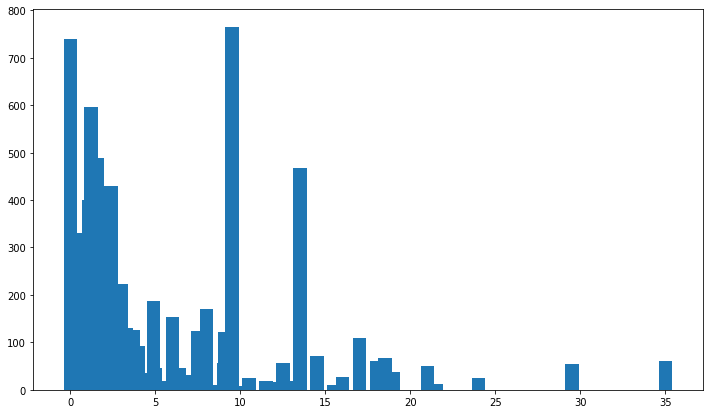

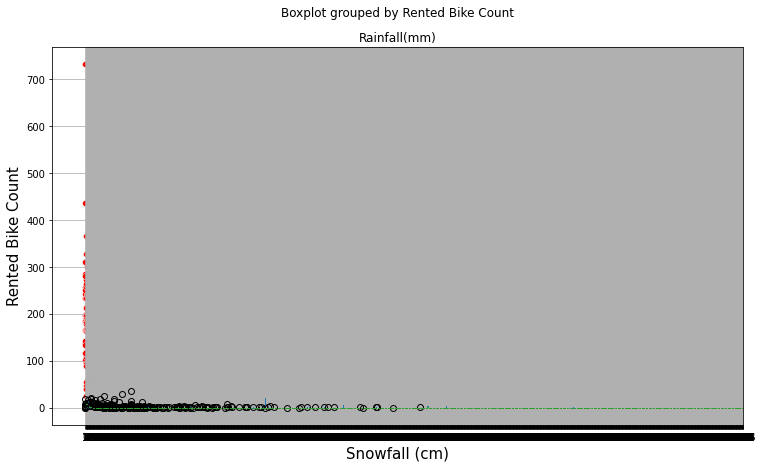

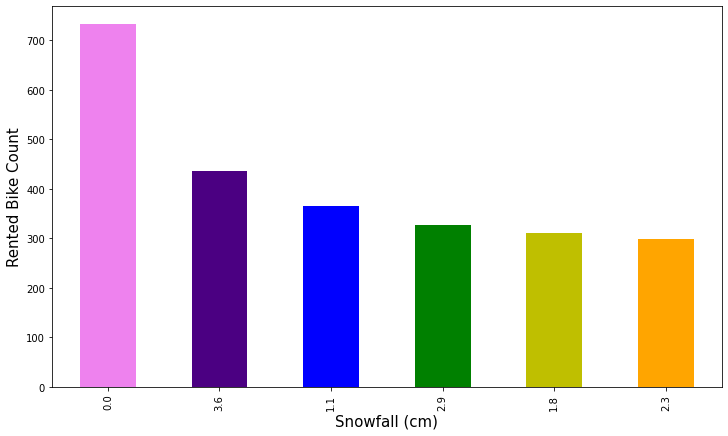

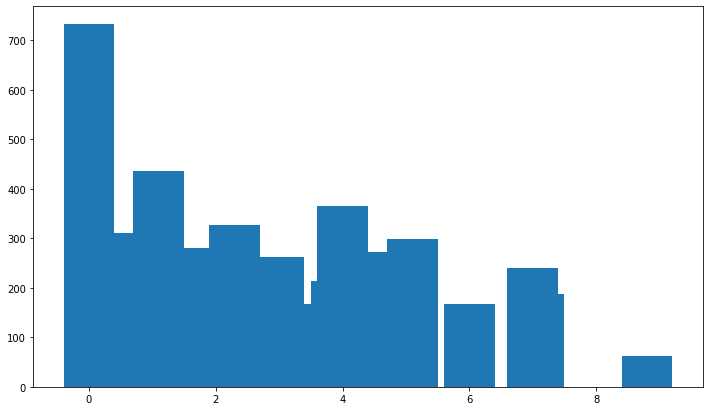

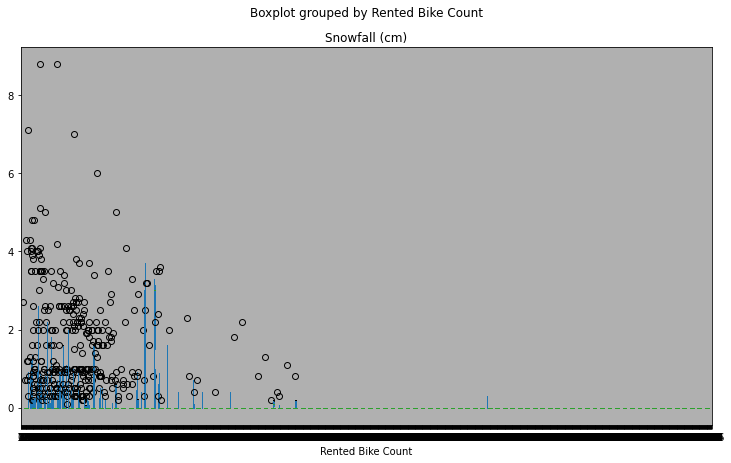

In [ ]:
for column in dataset.columns[2:11]:
  column_wise_analysis(dataset,column)


## **Handling Numeric Features**

In [ ]:
numerical_features


Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'year',
       'month', 'day'],
      dtype='object')

**Univariate Analysis**

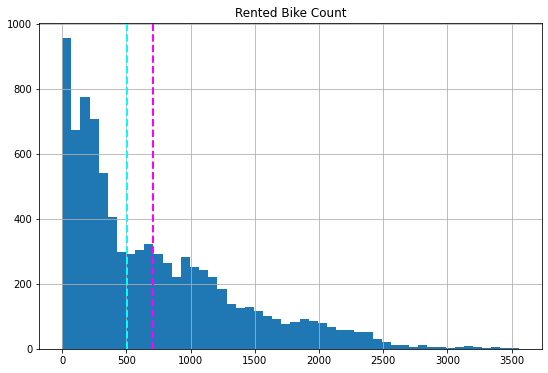

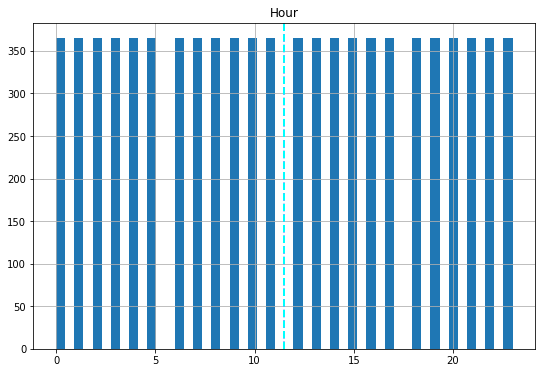

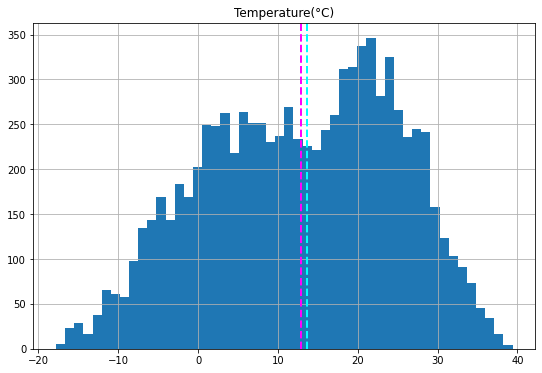

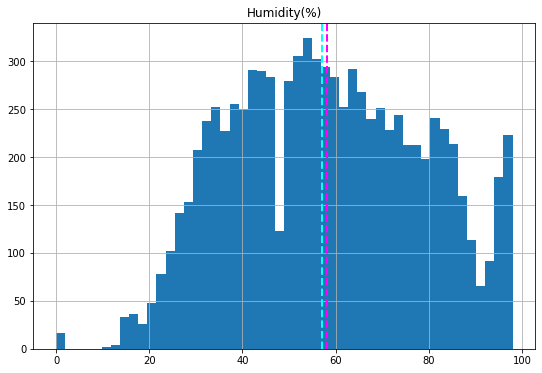

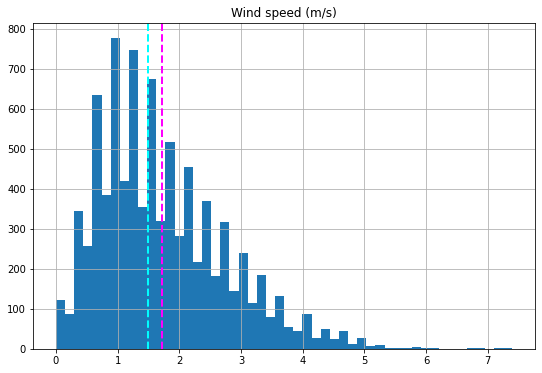

...

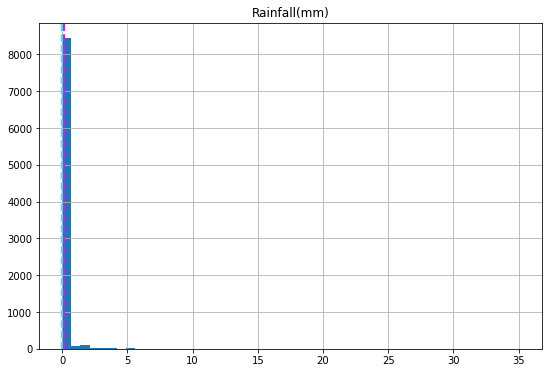

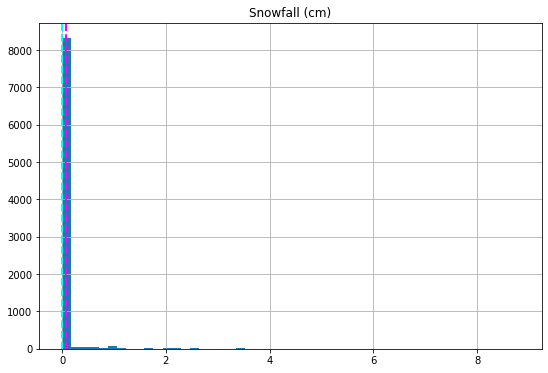

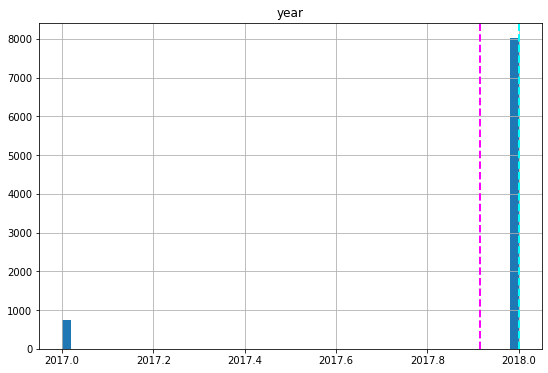

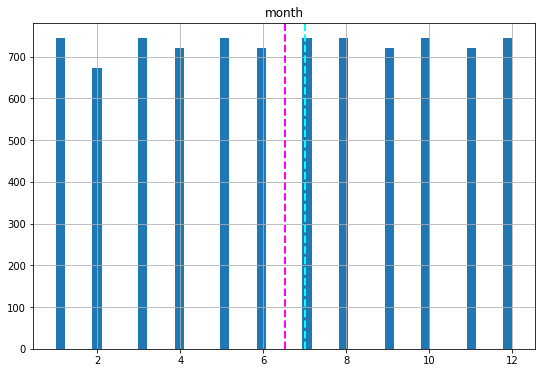

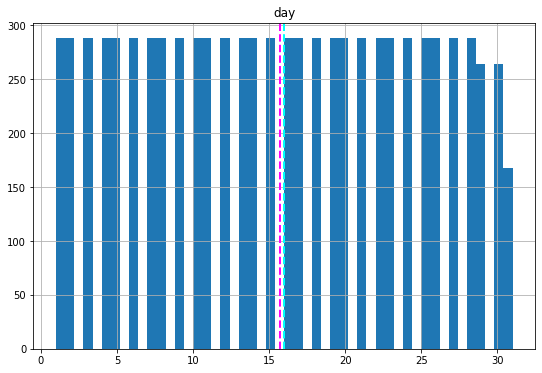

In [ ]:
#plot a bar plot for each numerical feature count with Hist Plot (except car_ID)
for col in numerical_features:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature= (dataset[col])
  feature.hist(bins=50, ax=ax)
  ax.axvline(feature.mean(),color='magenta', linestyle='dashed', linewidth=2)
  ax.axvline(feature.median(),color='cyan', linestyle='dashed', linewidth=2)
  ax.set_title(col)
plt.show()

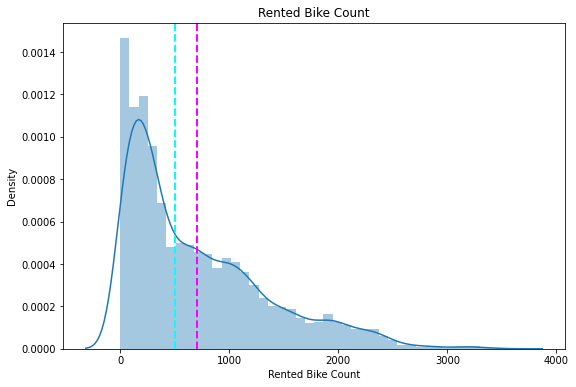

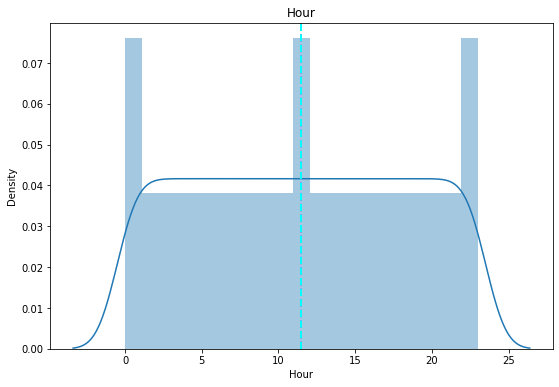

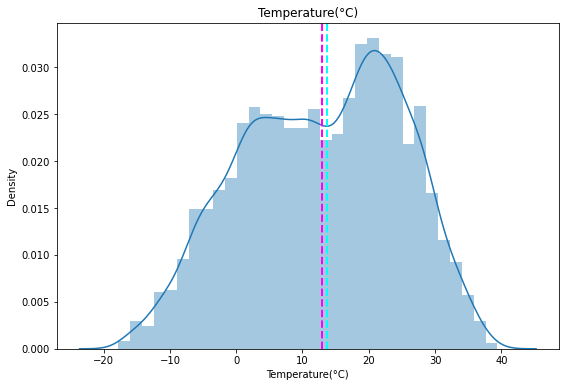

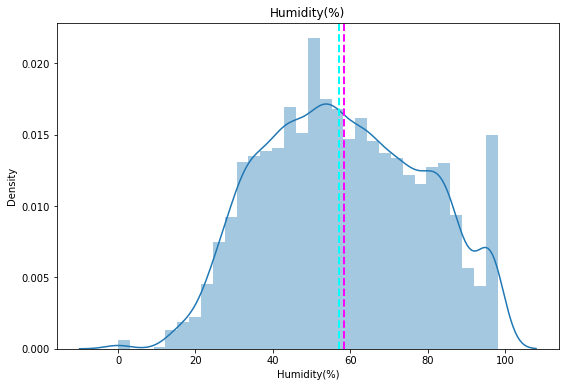

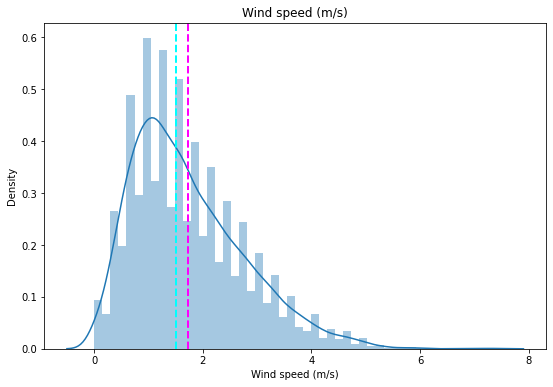

...

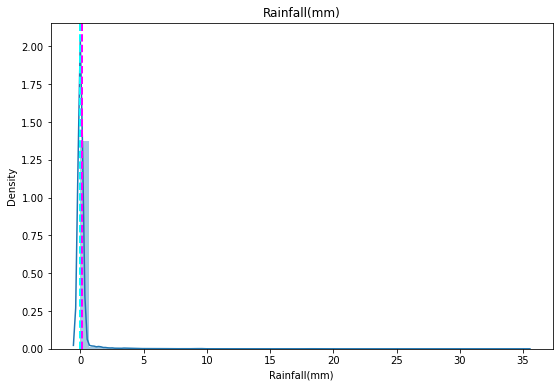

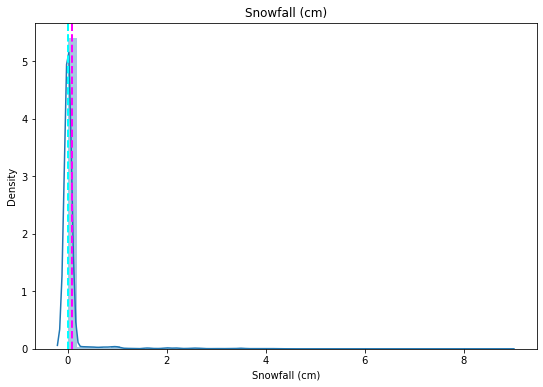

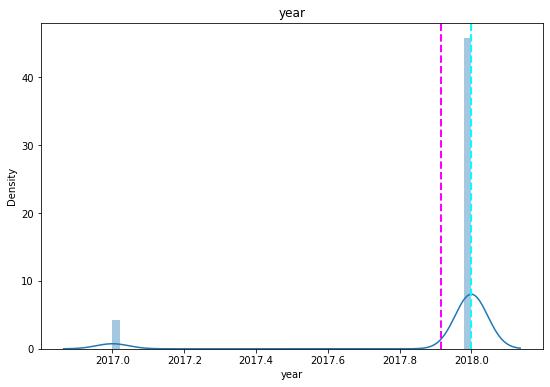

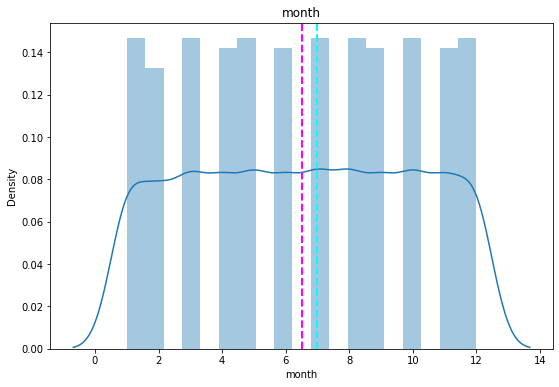

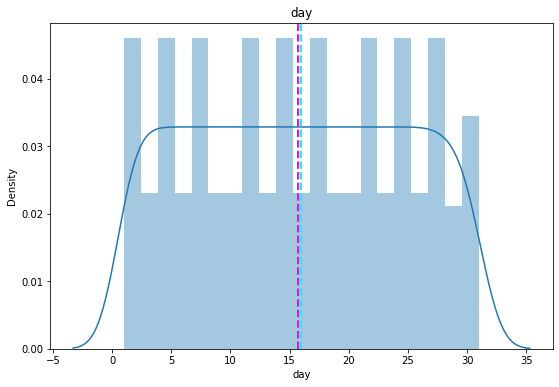

In [ ]:
#plot a bar plot for each numerical feature count with Dist Plot (except Car_ID)
for col in numerical_features:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature= (dataset[col])
  sns.distplot(dataset[col])
  ax.axvline(feature.mean(),color='magenta', linestyle='dashed', linewidth=2)
  ax.axvline(feature.median(),color='cyan', linestyle='dashed', linewidth=2)
  ax.set_title(col)
plt.show()

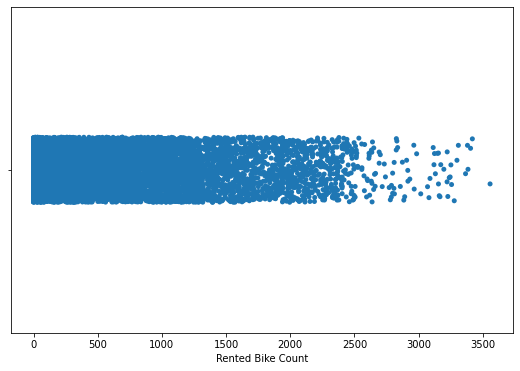

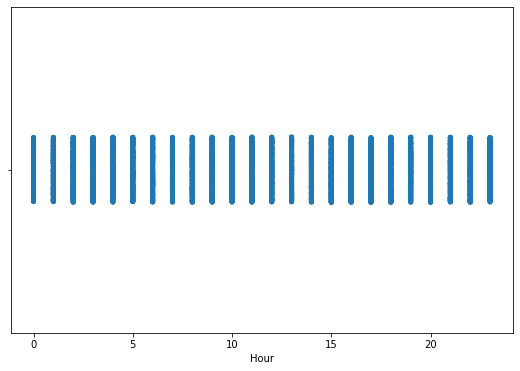

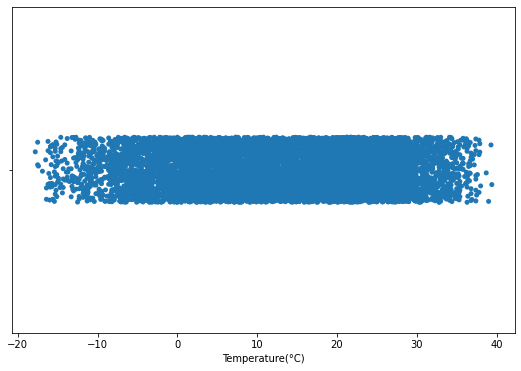

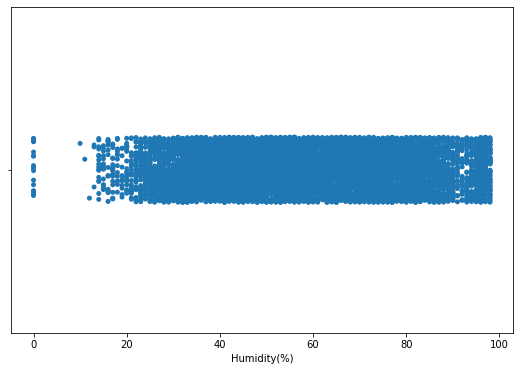

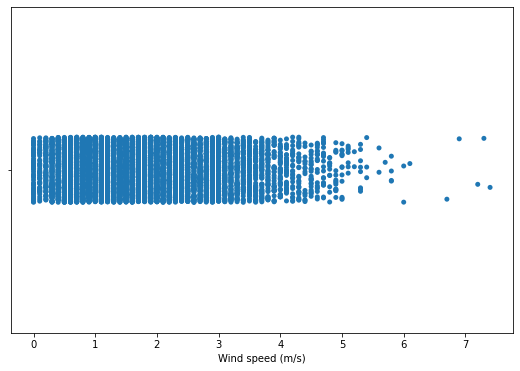

...

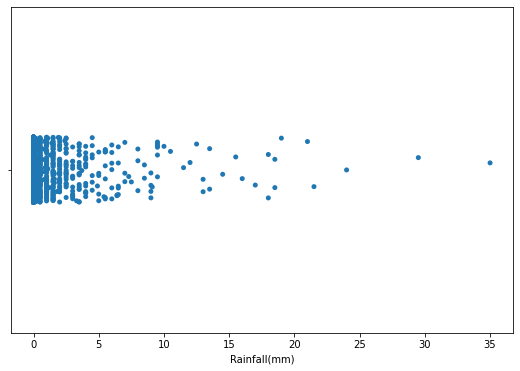

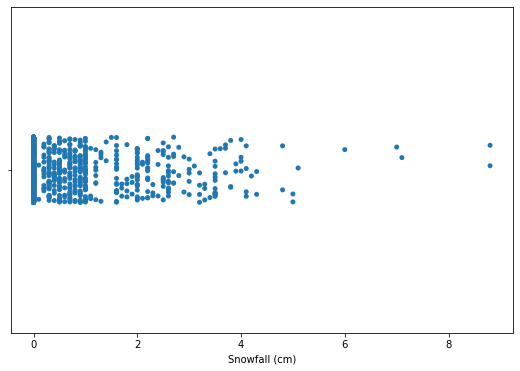

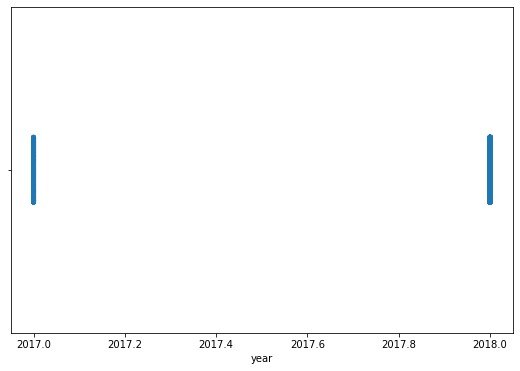

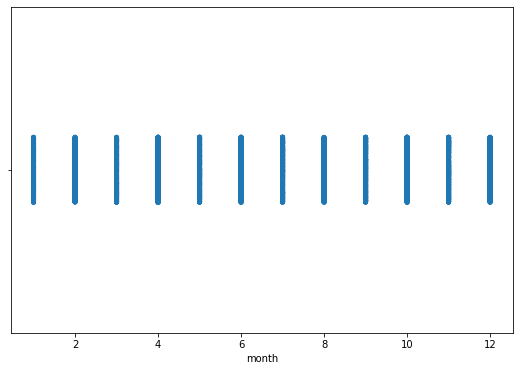

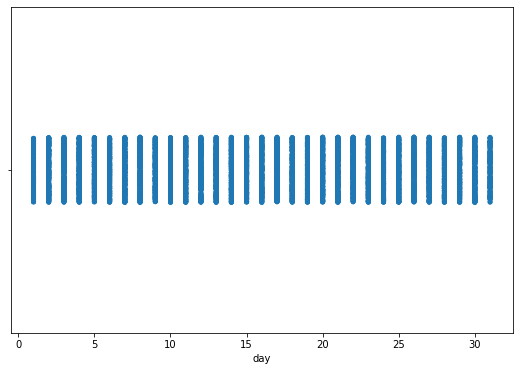

In [ ]:
for col in numerical_features:
  fig=plt.figure(figsize=(9,6))
  sns.stripplot(dataset[col])

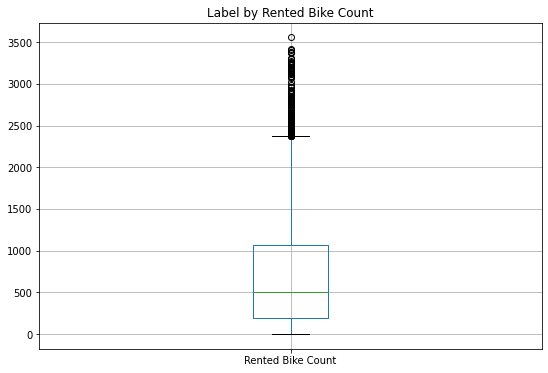

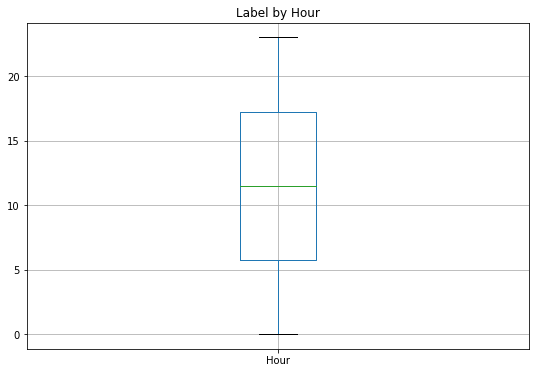

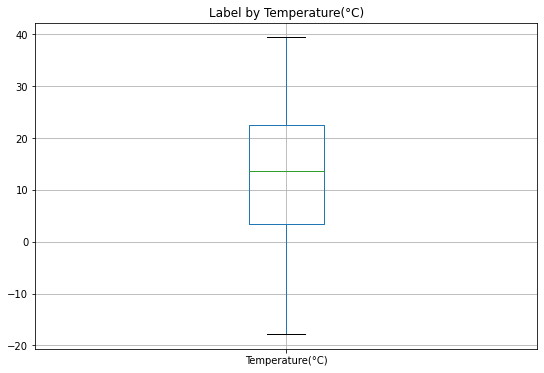

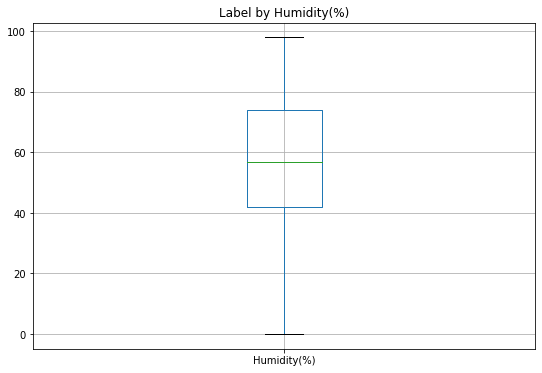

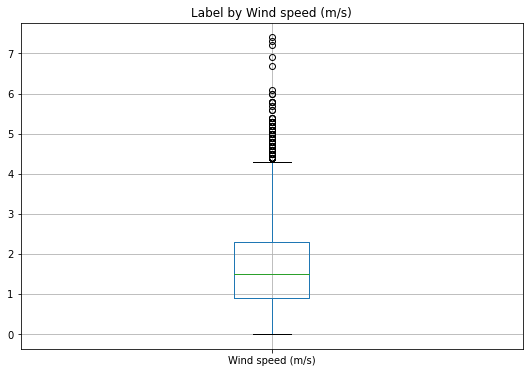

...

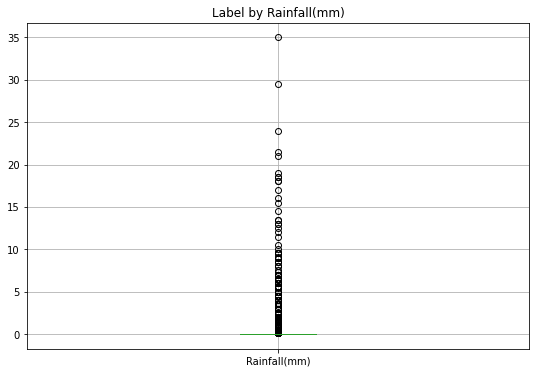

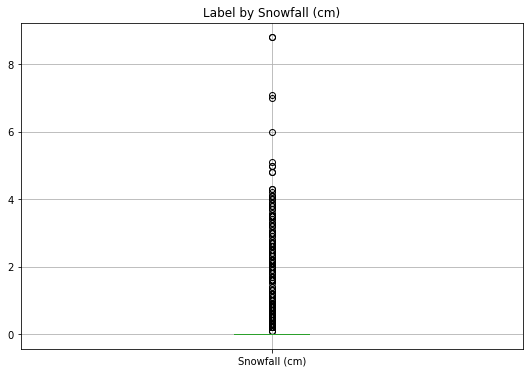

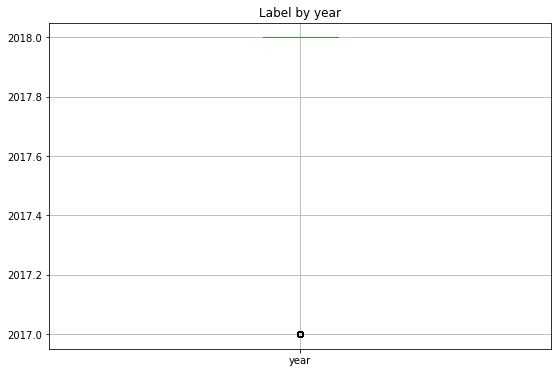

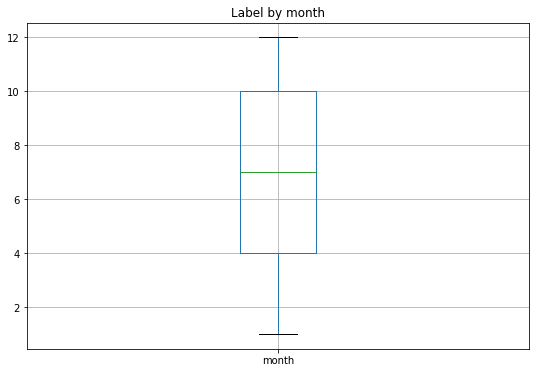

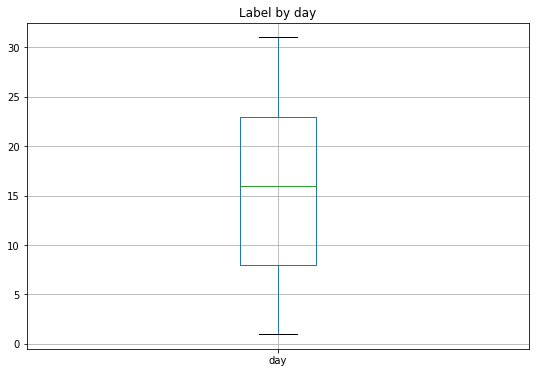

In [ ]:
# plot a boxplot for the label by each numerical feature  

for col in numerical_features:
    fig = plt.figure(figsize=(9, 6))
    ax = fig.gca()
    dataset.boxplot(col)
    ax.set_title('Label by ' + col)
    #ax.set_ylabel("Churn")
plt.show()

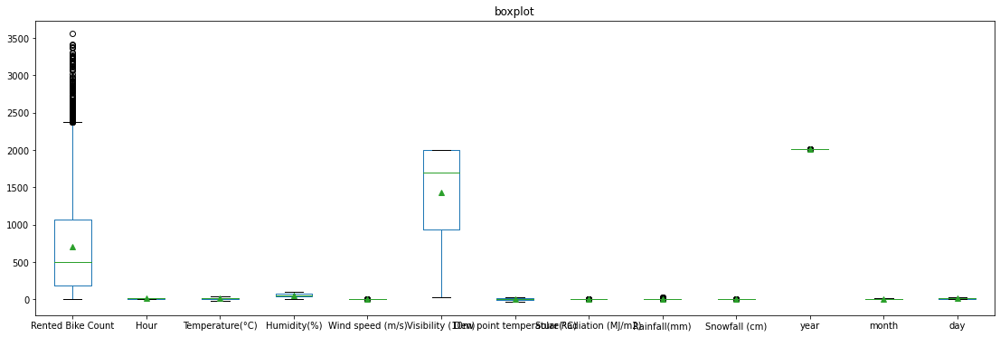

In [ ]:
plt.rcParams['figure.figsize']=(19,6)
ax = dataset[['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'year',
       'month', 'day']].plot(kind='box', title='boxplot', showmeans=True)

plt.show()

**Bivariate Analysis**

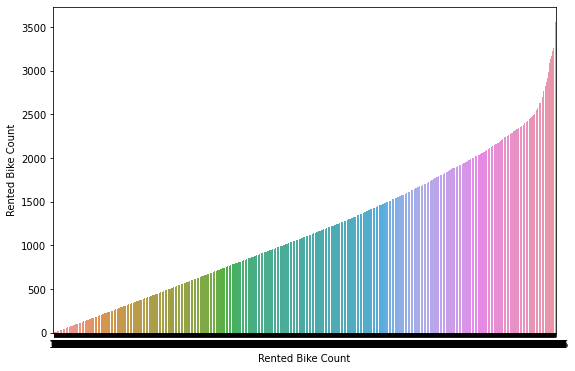

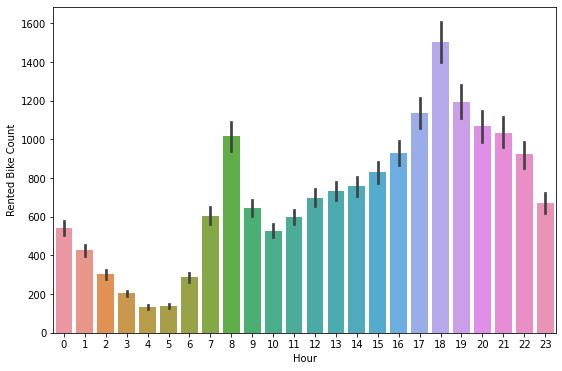

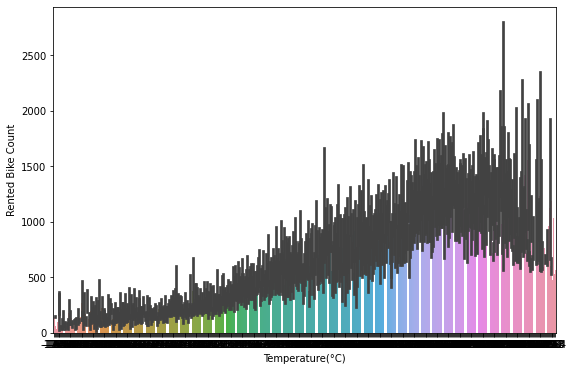

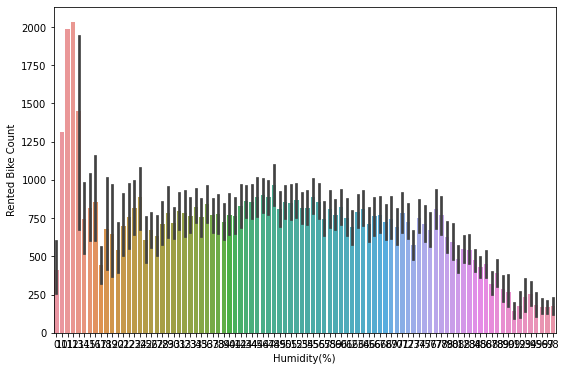

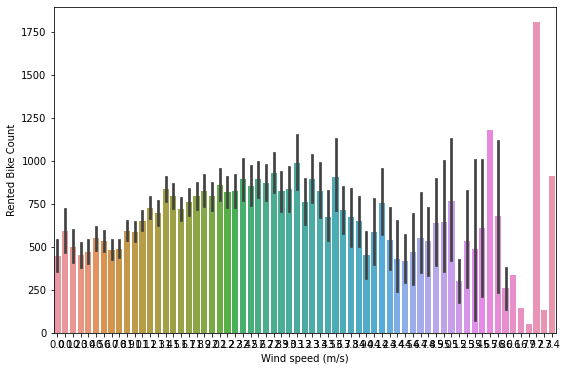

...

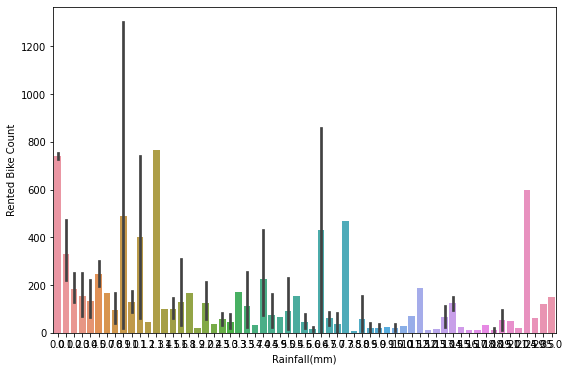

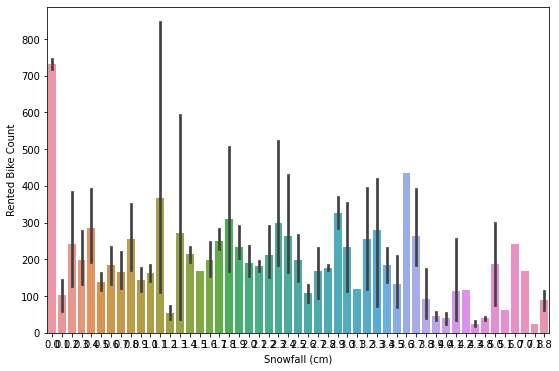

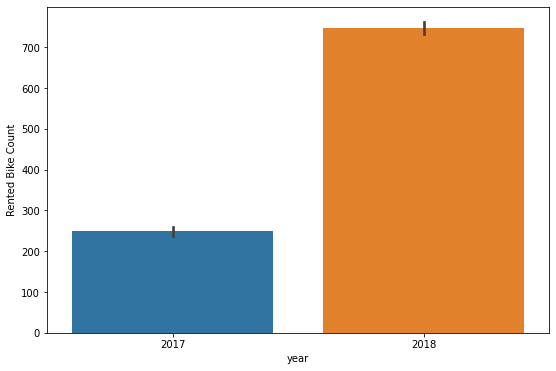

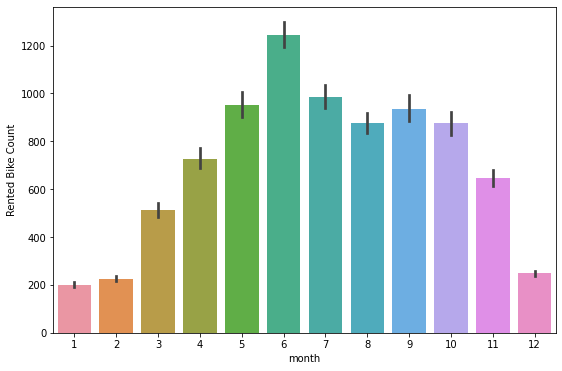

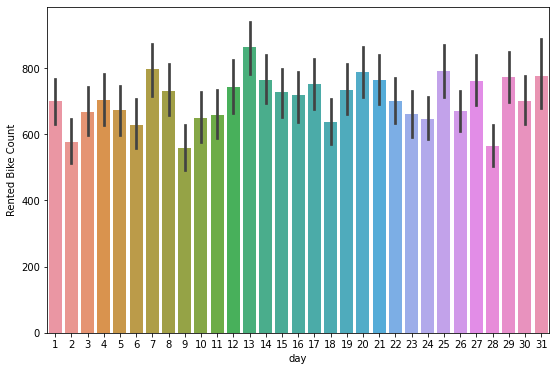

In [ ]:
for col in numerical_features:
  fig=plt.figure(figsize=(9,6))
  sns.barplot(x=col,y='Rented Bike Count', data=dataset)

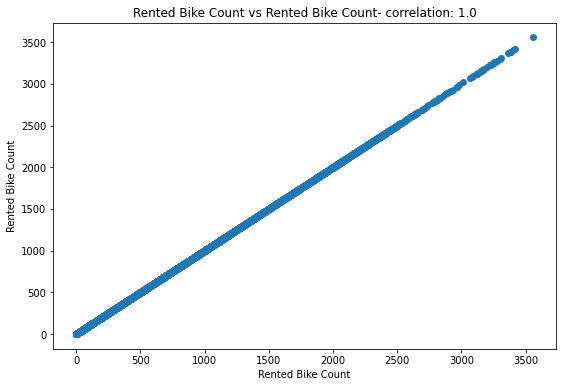

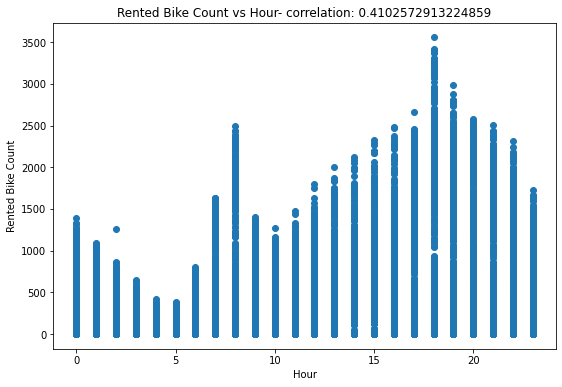

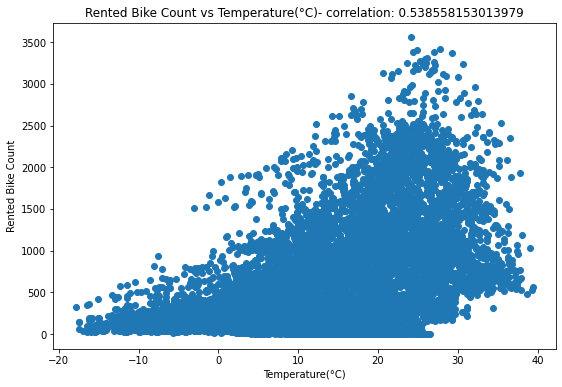

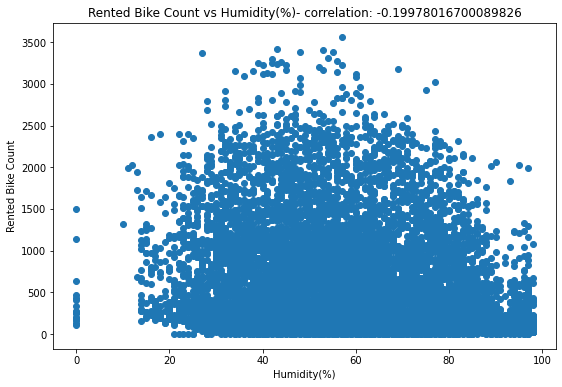

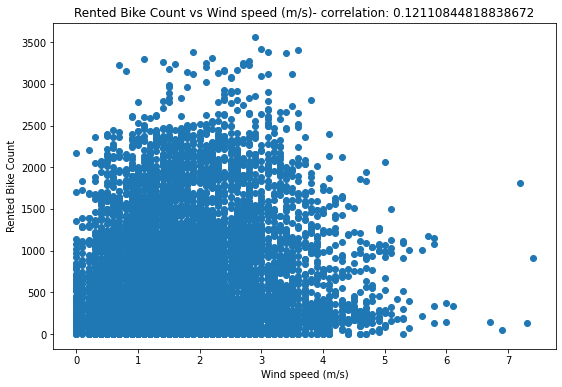

...

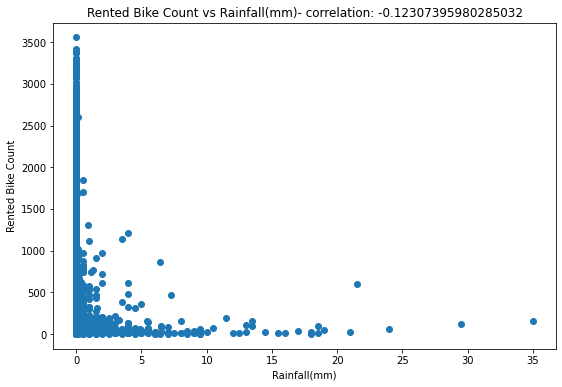

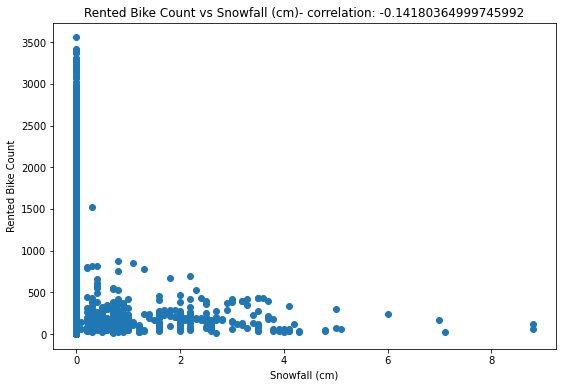

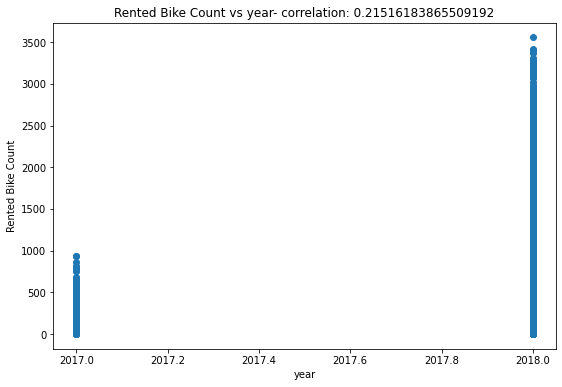

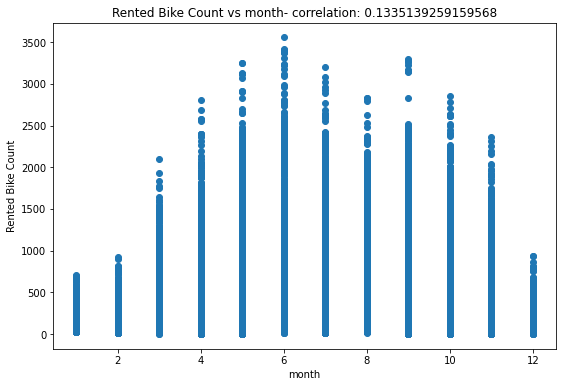

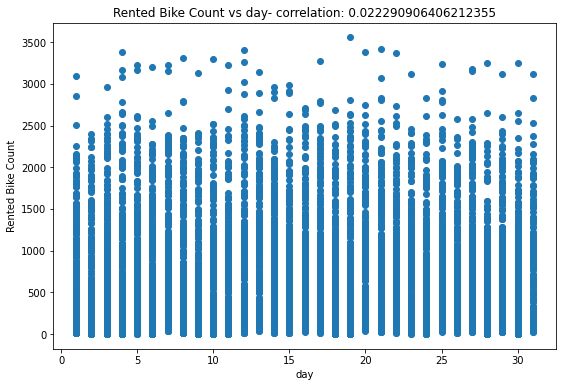

In [ ]:
for col in numerical_features:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature=dataset[col]
  label=dataset['Rented Bike Count']
  correlation= feature.corr(label)
  plt.scatter(x=feature,y=label)
  plt.xlabel(col)
  plt.ylabel('Rented Bike Count')
  ax.set_title('Rented Bike Count vs ' +col +'- correlation: '+ str(correlation))
  z=np.polyfit(dataset[col], dataset['Rented Bike Count'], 1)
  y_hat = np.poly1d(z)(dataset[col])

 

plt.show()

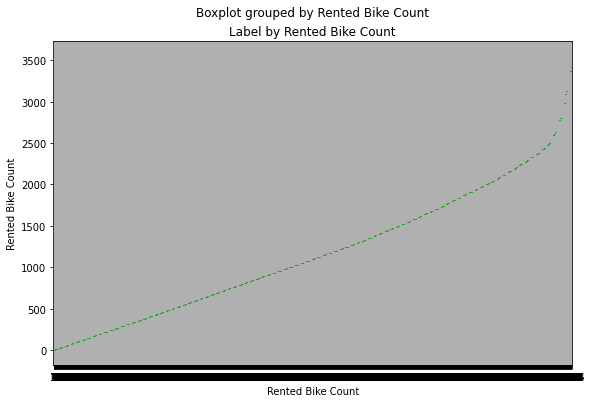

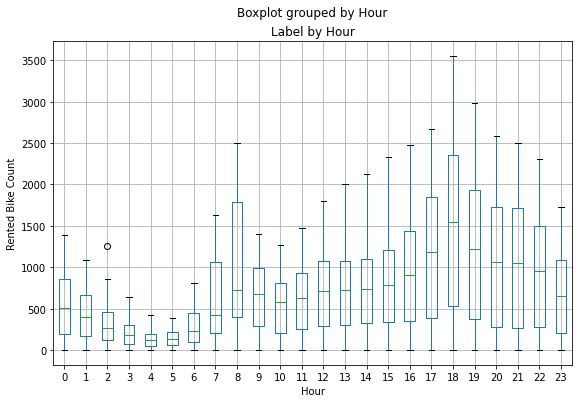

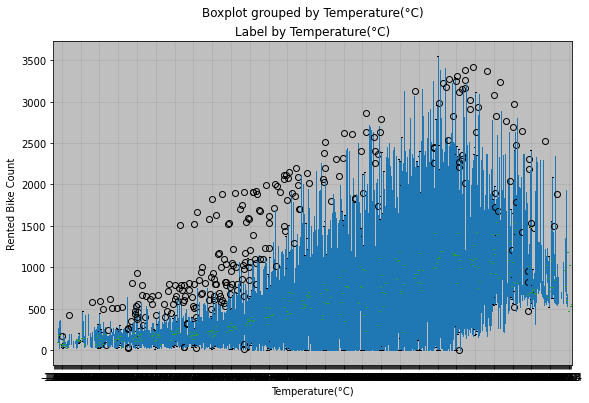

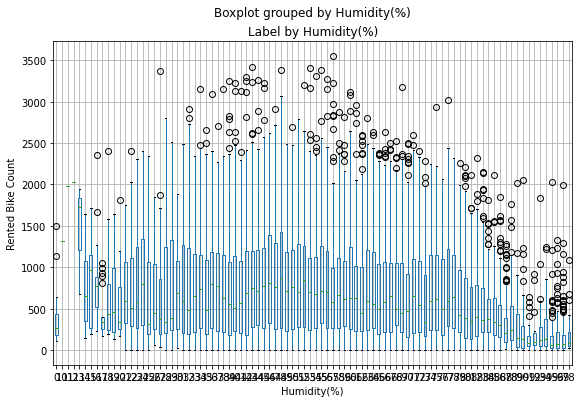

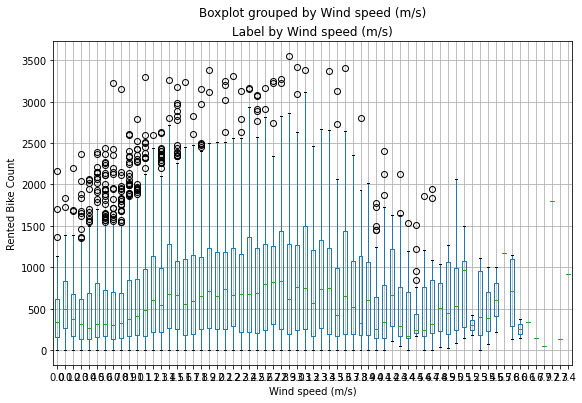

...

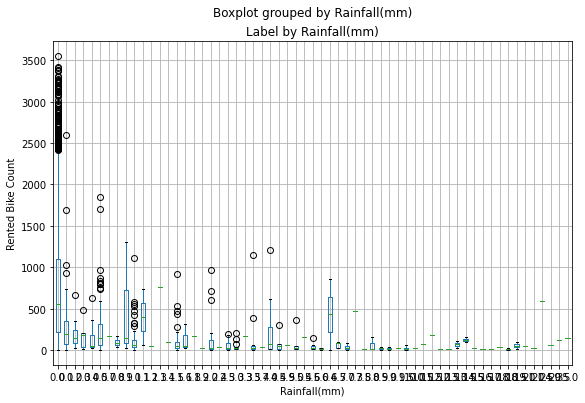

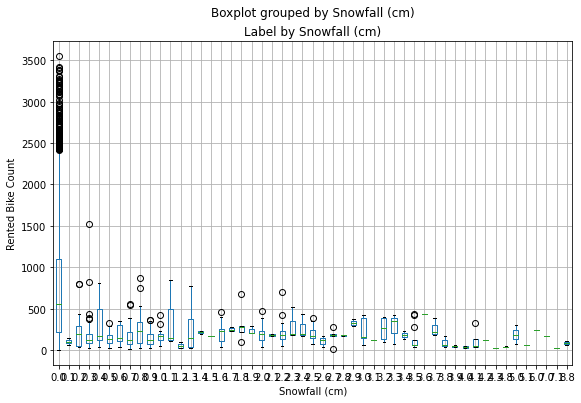

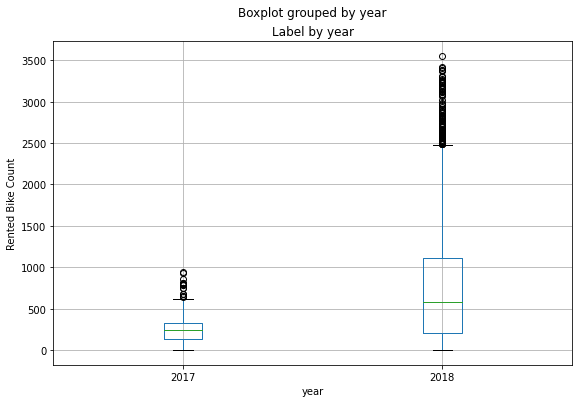

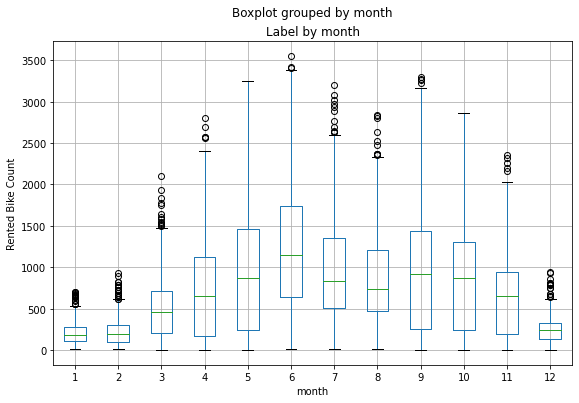

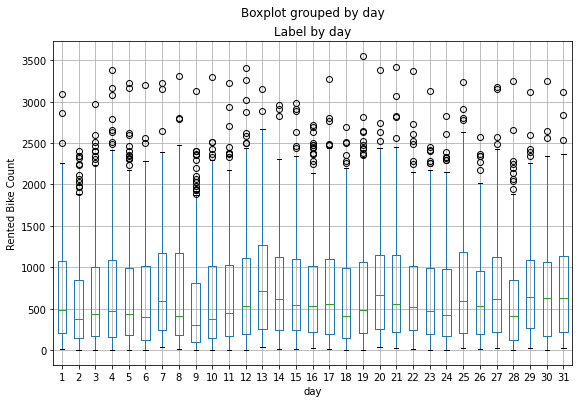

In [ ]:
# plot a boxplot for the label by each numerical feature  

for col in numerical_features:
    fig = plt.figure(figsize=(9, 6))
    ax = fig.gca()
    dataset.boxplot(column = 'Rented Bike Count', by = col, ax = ax)
    ax.set_title('Label by ' + col)
    ax.set_ylabel("Rented Bike Count")
plt.show()

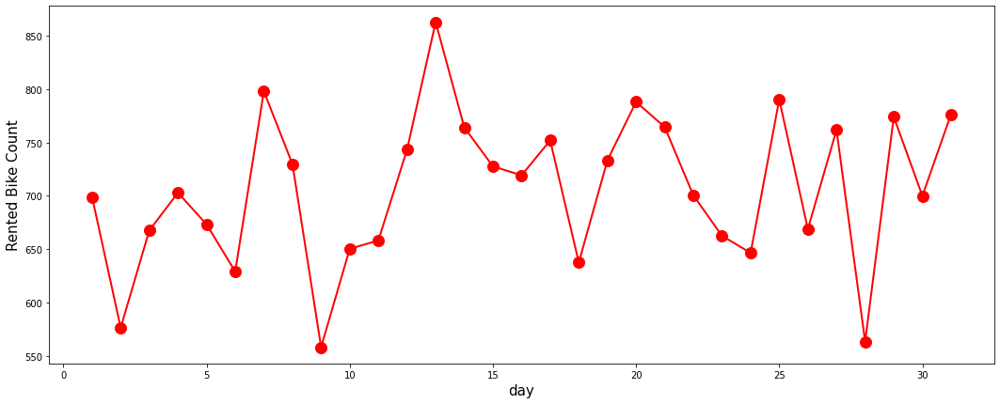

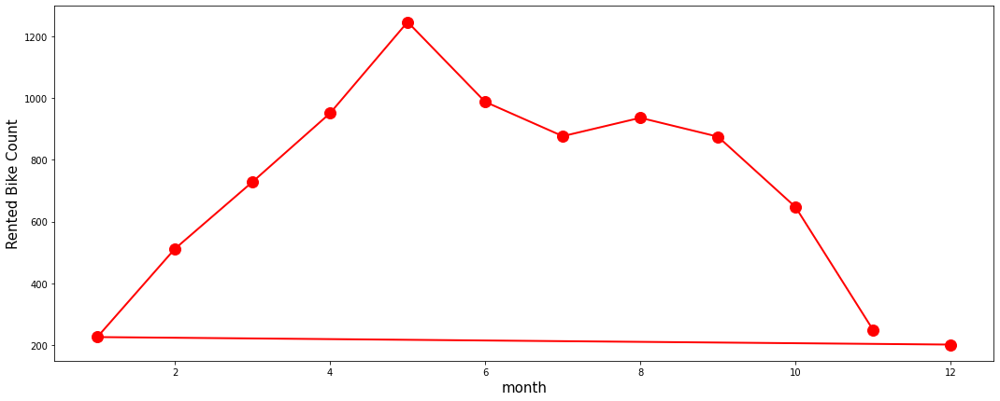

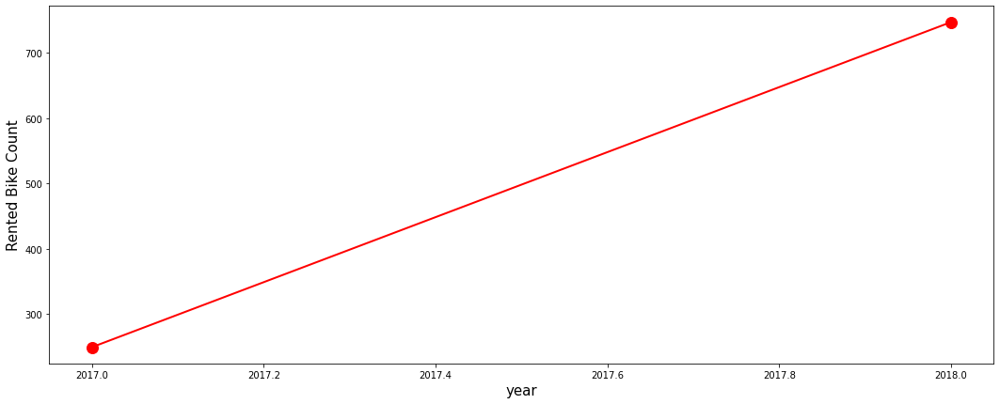

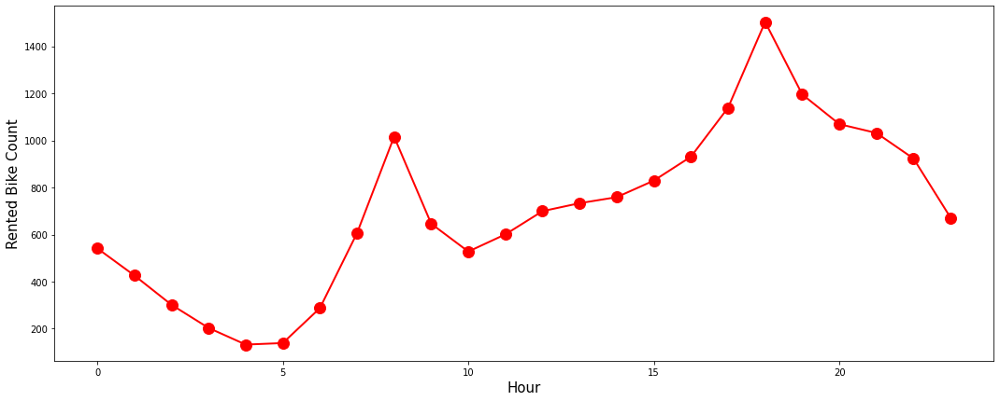

In [ ]:
for i in ['day','month','year','Hour']:
  s1=dataset[i].unique()
  s2=dataset.groupby([i])['Rented Bike Count'].mean()

  plt.rcParams['figure.figsize'] = (18, 7)

  plt.plot(s1,s2,color='r', marker='o', linewidth=2, markersize=12)

  
  plt.xlabel(i, fontsize = 15)
  plt.ylabel('Rented Bike Count', fontsize = 15)
  plt.show()

**Correlation**

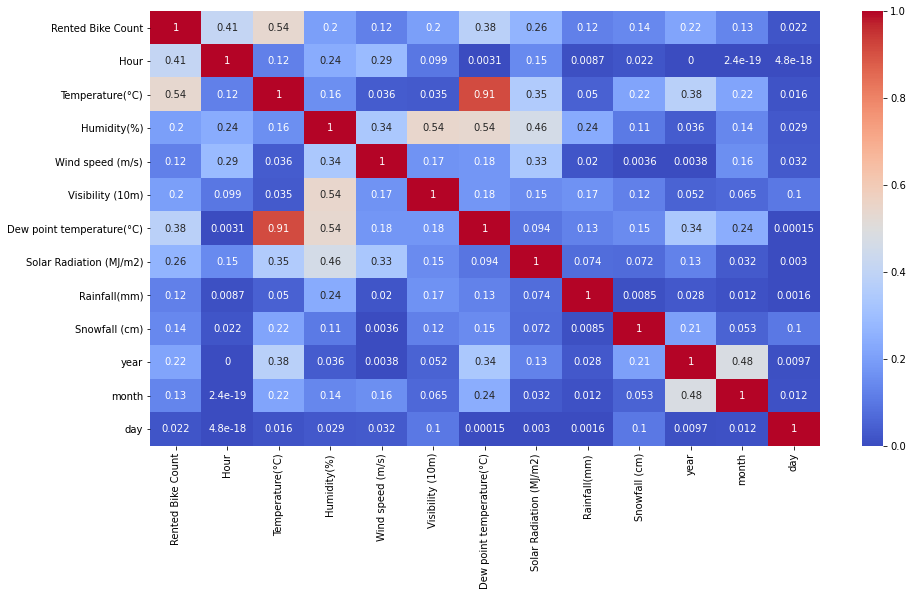

In [ ]:
## Correlation
plt.figure(figsize=(15,8))
correlation=dataset.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

In [ ]:
corr = dataset.corr()
cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

corr.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
    .set_caption("Hover to magify")\
    .set_precision(2)\
    .set_table_styles(magnify())

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),year,month,day
Rented Bike Count,1.00,0.41,0.54,-0.20,0.12,0.20,0.38,0.26,-0.12,-0.14,0.22,0.13,0.02
Hour,0.41,1.00,0.12,-0.24,0.29,0.10,0.00,0.15,0.01,-0.02,0.00,0.00,0.00
Temperature(°C),0.54,0.12,1.00,0.16,-0.04,0.03,0.91,0.35,0.05,-0.22,0.38,0.22,0.02
Humidity(%),-0.20,-0.24,0.16,1.00,-0.34,-0.54,0.54,-0.46,0.24,0.11,0.04,0.14,-0.03
Wind speed (m/s),0.12,0.29,-0.04,-0.34,1.00,0.17,-0.18,0.33,-0.02,-0.00,-0.00,-0.16,-0.03
Visibility (10m),0.20,0.10,0.03,-0.54,0.17,1.00,-0.18,0.15,-0.17,-0.12,0.05,0.06,-0.10
Dew point temperature(°C),0.38,0.00,0.91,0.54,-0.18,-0.18,1.00,0.09,0.13,-0.15,0.34,0.24,0.00
Solar Radiation (MJ/m2),0.26,0.15,0.35,-0.46,0.33,0.15,0.09,1.00,-0.07,-0.07,0.13,-0.03,-0.00
Rainfall(mm),-0.12,0.01,0.05,0.24,-0.02,-0.17,0.13,-0.07,1.00,0.01,0.03,0.01,-0.00
Snowfall (cm),-0.14,-0.02,-0.22,0.11,-0.00,-0.12,-0.15,-0.07,0.01,1.00,-0.21,0.05,0.10


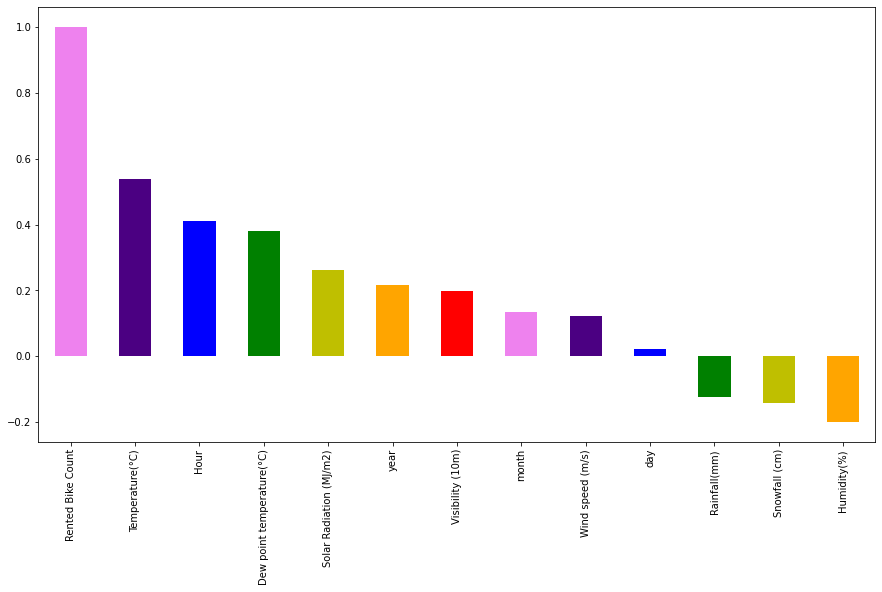

In [ ]:
# correlation

plt.figure(figsize=(15,8))
dataset.corr()['Rented Bike Count'].sort_values(ascending = False).plot(kind='bar',color = ['violet','indigo','b','g','y','orange','r'])

## **Handling Categorical Features**

In [ ]:
# Catagorical
dataset.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,year,month,day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8760 entries, 0 to 8759
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       8760 non-null   datetime64[ns]
 1   Rented Bike Count          8760 non-null   int64         
 2   Hour                       8760 non-null   int64         
 3   Temperature(°C)            8760 non-null   float64       
 4   Humidity(%)                8760 non-null   int64         
 5   Wind speed (m/s)           8760 non-null   float64       
 6   Visibility (10m)           8760 non-null   int64         
 7   Dew point temperature(°C)  8760 non-null   float64       
 8   Solar Radiation (MJ/m2)    8760 non-null   float64       
 9   Rainfall(mm)               8760 non-null   float64       
 10  Snowfall (cm)              8760 non-null   float64       
 11  Seasons                    8760 non-null   object        
 12  Holida

**Univariate Analysis**

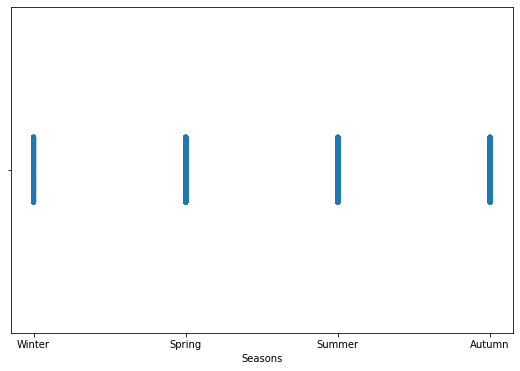

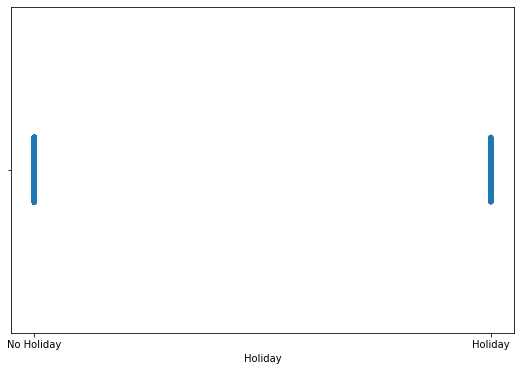

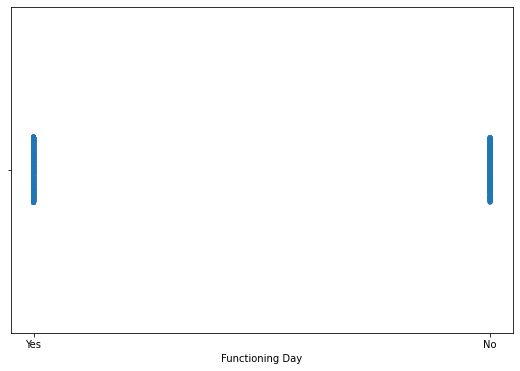

In [ ]:
for col in categorical_features:
  fig=plt.figure(figsize=(9,6))
  sns.stripplot(dataset[col])

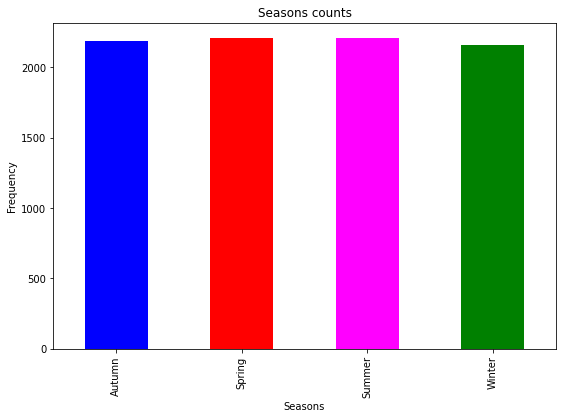

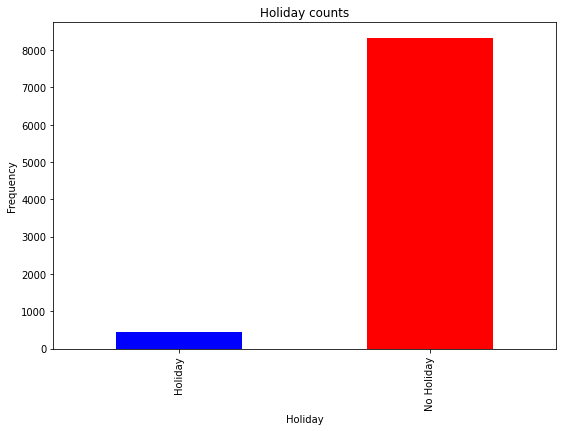

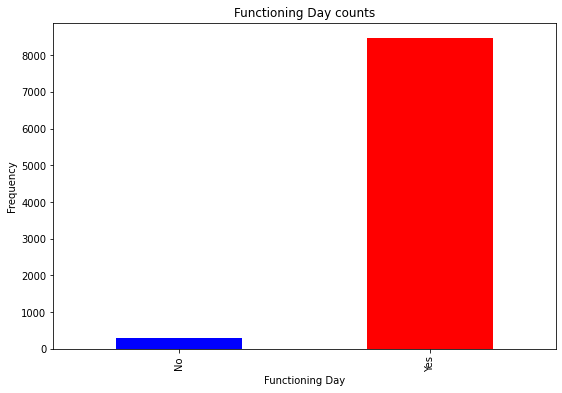

In [ ]:
# plot a bar plot for each categorical feature count 

for col in categorical_features:
    counts = dataset[col].value_counts().sort_index()
    fig = plt.figure(figsize=(9, 6))
    ax = fig.gca()
    counts.plot.bar(ax = ax, color=['blue','red','magenta','g'])
    ax.set_title(col + ' counts')
    ax.set_xlabel(col) 
    ax.set_ylabel("Frequency")
plt.show()

**Bivariate Analysis**

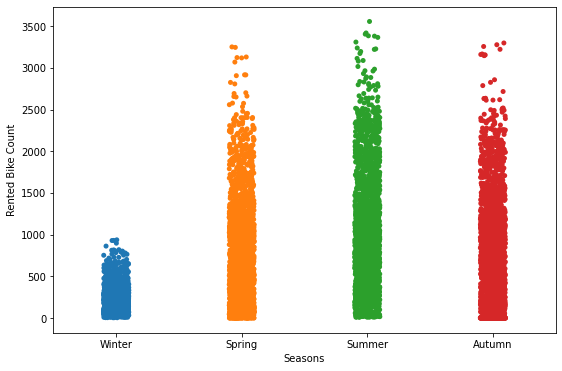

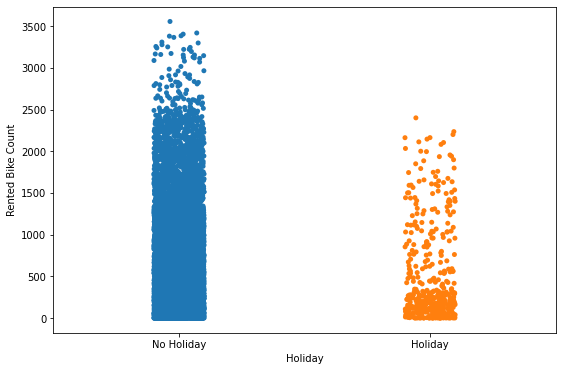

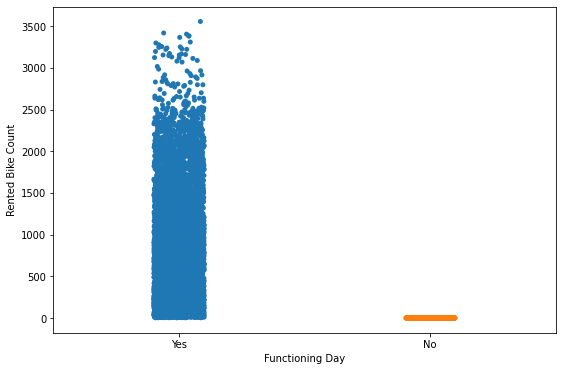

In [ ]:
for col in categorical_features:
  fig=plt.figure(figsize=(9,6))
  sns.stripplot(x=dataset[col],y=dataset['Rented Bike Count'])

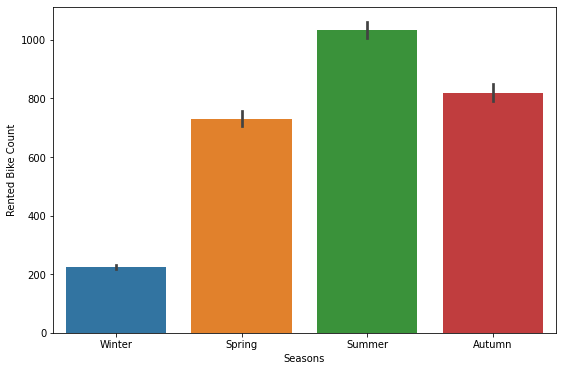

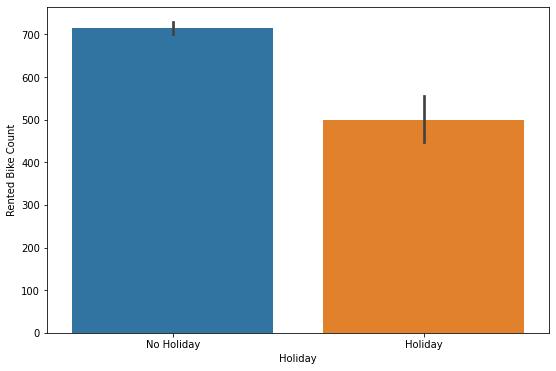

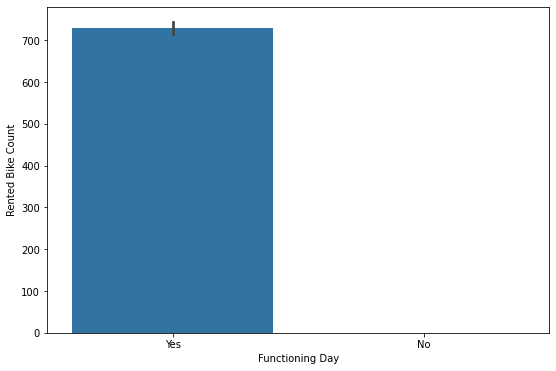

In [ ]:
for col in categorical_features:
  fig=plt.figure(figsize=(9,6))
  sns.barplot(x=dataset[col],y=dataset['Rented Bike Count'])

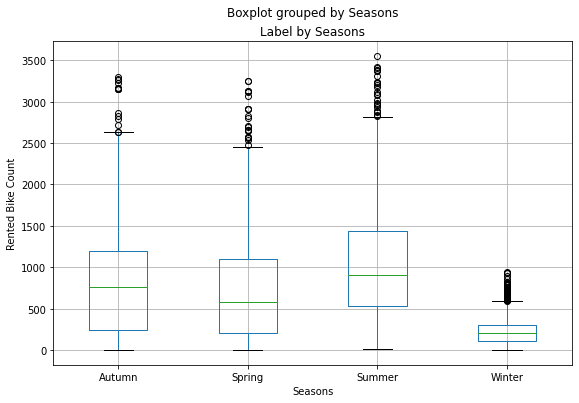

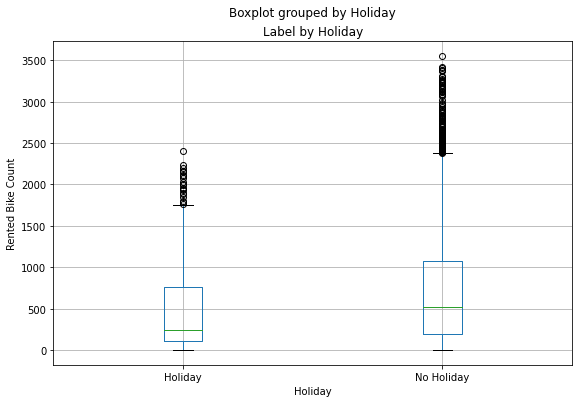

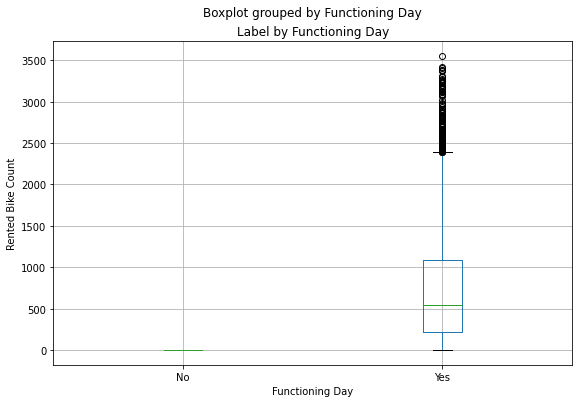

In [ ]:
# plot a boxplot for the label by each categorical feature  

for col in categorical_features:
    fig = plt.figure(figsize=(9, 6))
    ax = fig.gca()
    dataset.boxplot(column = 'Rented Bike Count', by = col, ax = ax)
    ax.set_title('Label by ' + col)
    ax.set_ylabel("Rented Bike Count")
plt.show()

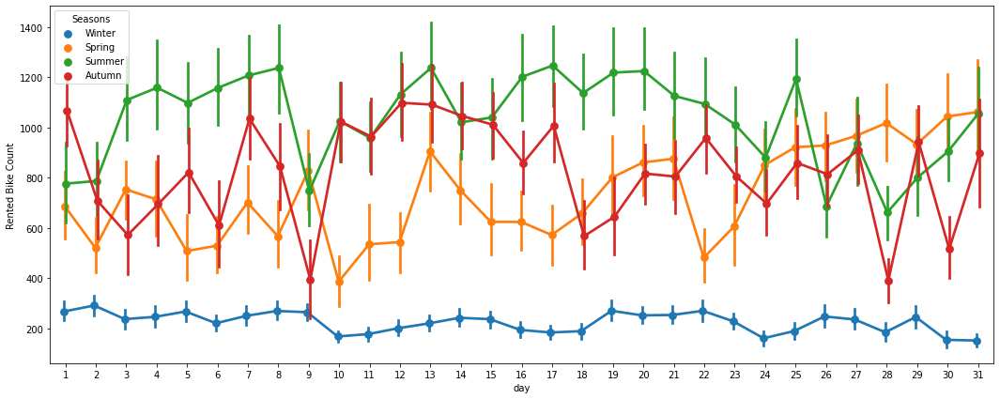

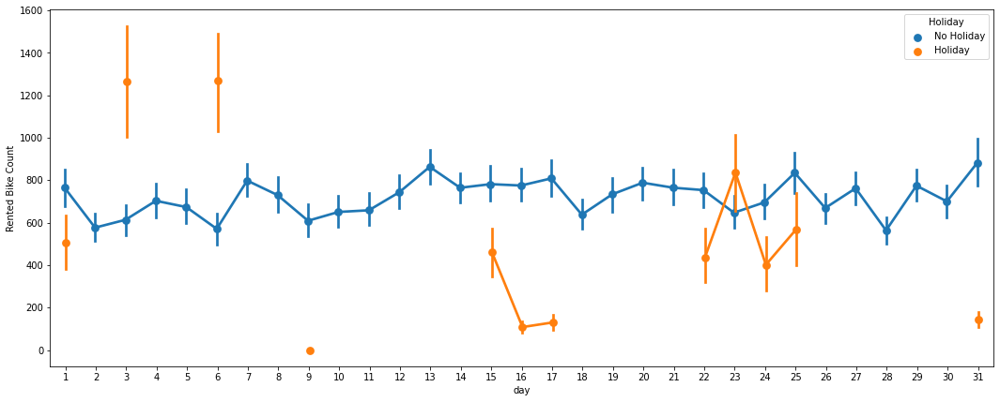

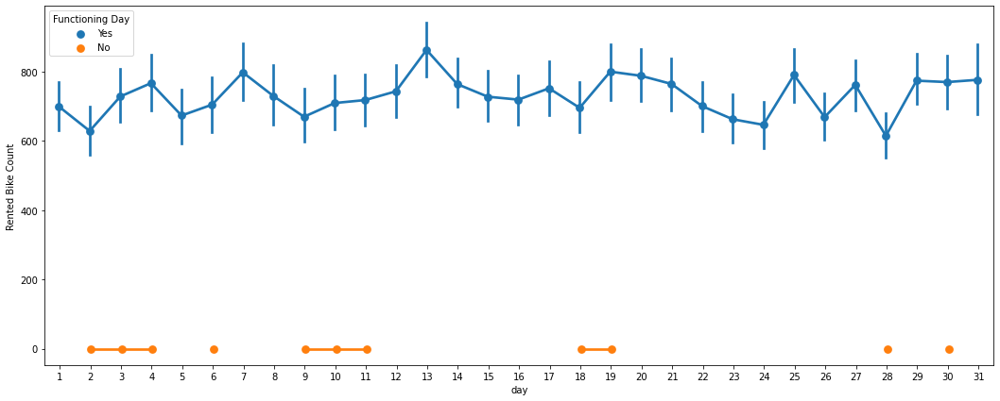

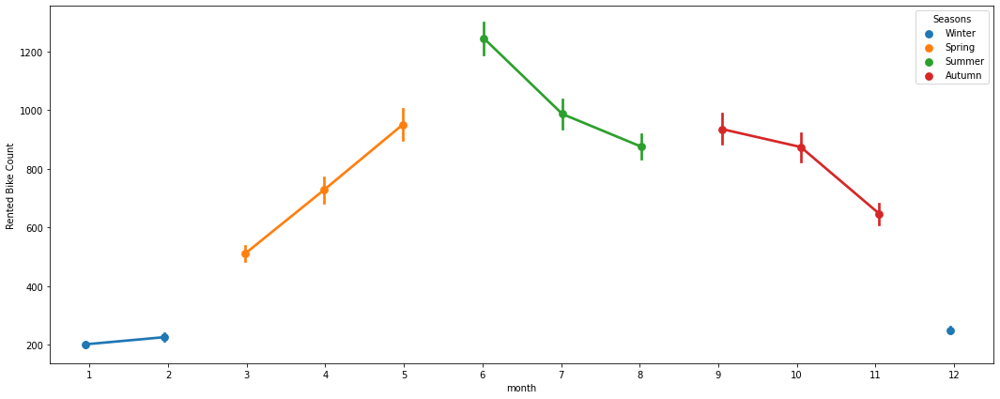

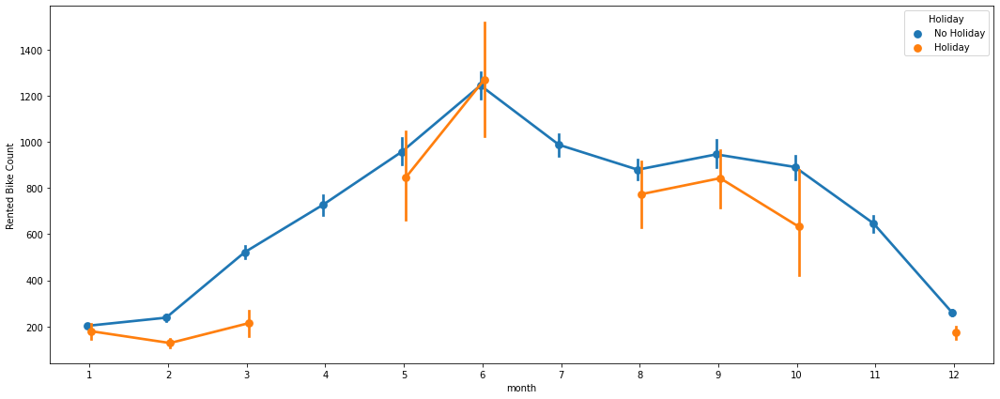

...

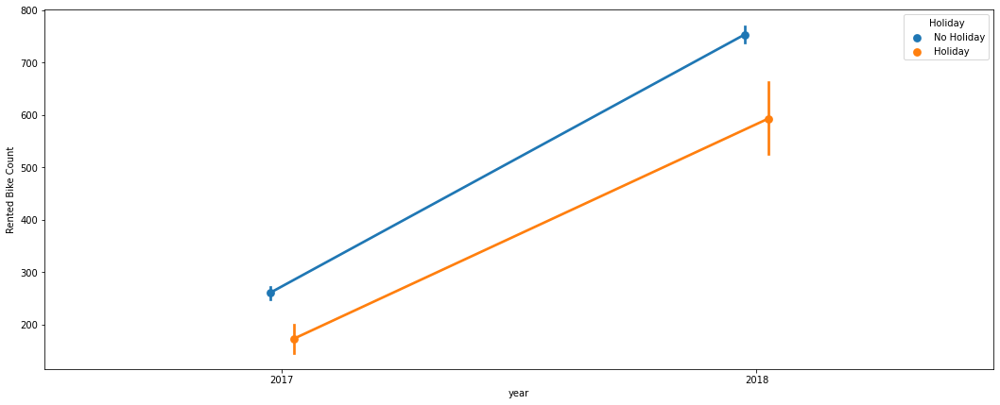

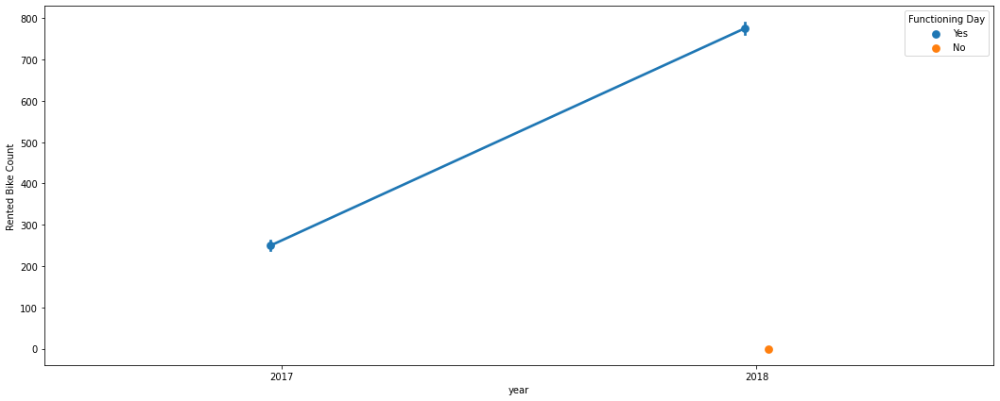

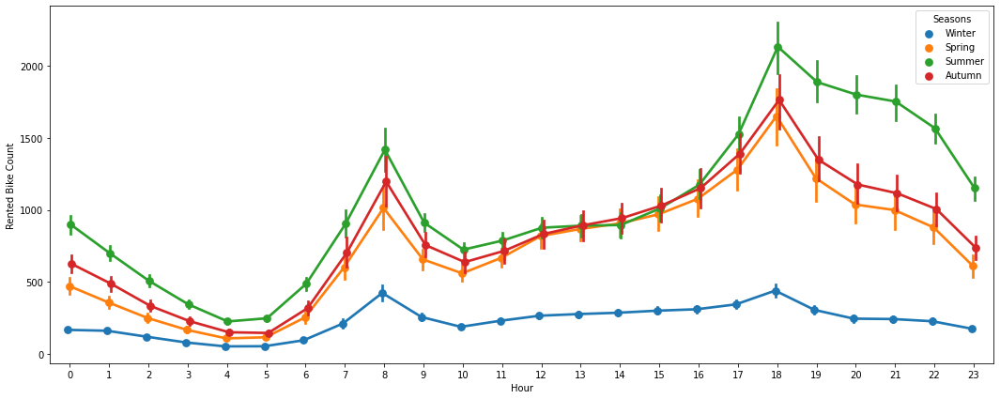

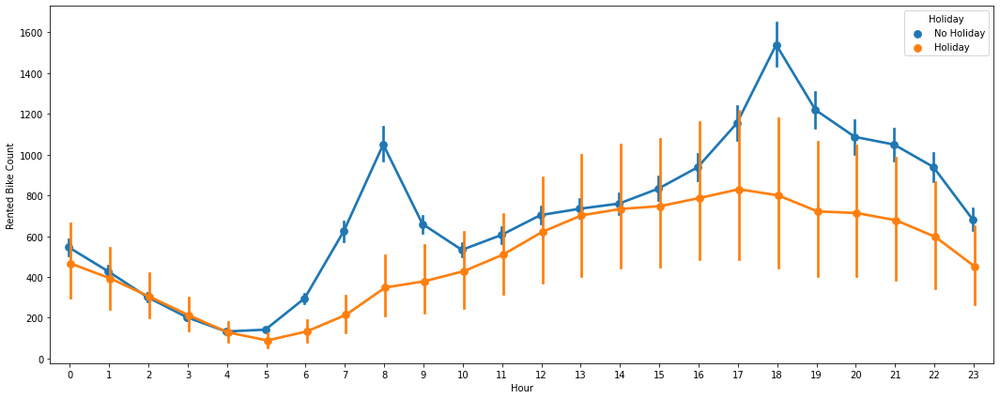

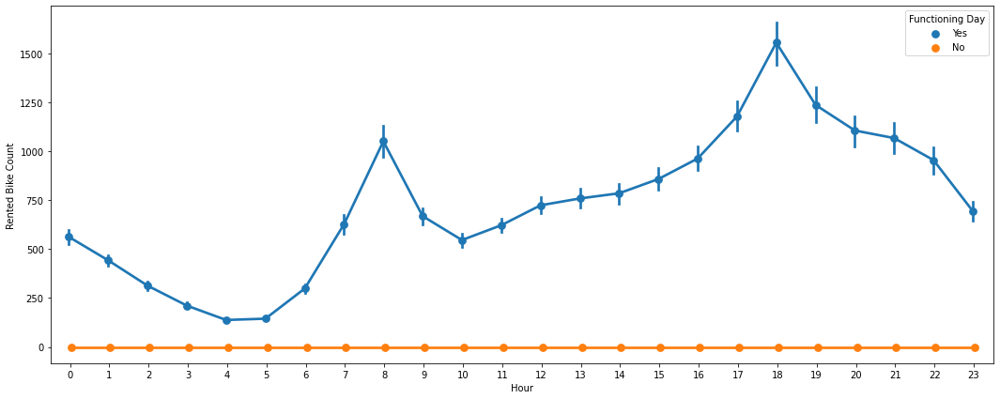

In [ ]:
for i in ['day','month','year','Hour']:
  ax = sns.pointplot(x=i, y="Rented Bike Count", hue="Seasons",
                   data=dataset, dodge=True)
  plt.show()
  

  ax = sns.pointplot(x=i, y="Rented Bike Count", hue="Holiday",
                   data=dataset, dodge=True)
  plt.show()
  

  ax = sns.pointplot(x=i, y="Rented Bike Count", hue="Functioning Day",
                   data=dataset, dodge=True)
  plt.show()



In [ ]:
dataset['Seasons'].value_counts()

Summer    2208
Spring    2208
Autumn    2184
Winter    2160
Name: Seasons, dtype: int64

In [ ]:
## Label Encoding for Seasons
dataset1=dataset.copy()
dict3={"Summer":1,"Spring":4,"Autumn":3,"Winter":2}

dataset1['Seasons']=dataset['Seasons'].map(dict3)

## One Hot encoding for Holiday and Functioning Day




In [ ]:
def modified(row):
  if (row['Holiday']=="Holiday"):
    val = 0
  
  else:
    val = 1
  
  return val

In [ ]:
dataset1['Holiday'] = dataset1.apply(modified,axis = 1)


In [ ]:
def modified_1(row):
  if (row['Functioning Day']=="No"):
    val = 0
  
  else:
    val = 1
  
  return val

In [ ]:
dataset1['Functioning Day'] = dataset1.apply(modified_1,axis = 1)


In [ ]:
dataset1.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,year,month,day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,2,1,1,2017,12,1
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,2,1,1,2017,12,1
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,2,1,1,2017,12,1
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,2,1,1,2017,12,1
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,2,1,1,2017,12,1


In [ ]:
dataset1.drop(['Date'],axis=1, inplace=True)

## **Final Pair Plot**

**Multivariate Analysis**

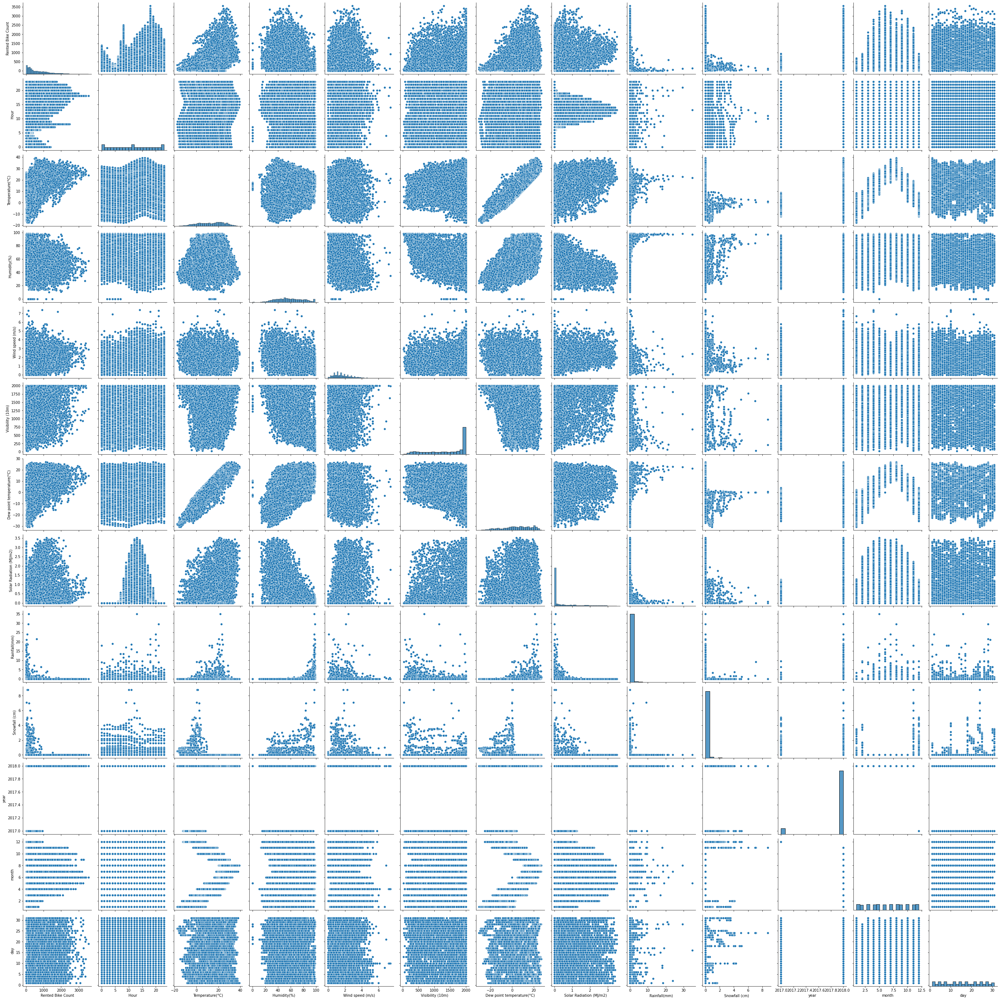

In [ ]:
sns.pairplot(dataset, size=3)

# **Feature Selection**

In [ ]:
## Dropping Constant Features
from sklearn.feature_selection import VarianceThreshold
var_thres= VarianceThreshold(threshold=0)
var_thres.fit(dataset1)


VarianceThreshold(threshold=0)

In [ ]:
var_thres.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True])

***There is no low variance Feature.***

In [ ]:
## Feature Selection with Pearson Correlation
def correlation(data,threshold):
  col_corr=set()
  corr_matrix=data.corr()
  for i in range(len(corr_matrix.columns)):
    for j in range(i):
      if abs(corr_matrix.iloc[i,j])>threshold:
        colname=corr_matrix.columns[i]
        col_corr.add(colname)
  return col_corr

In [ ]:
## Feature Selection with Pearson Correlation
def correlation_low(data,threshold):
  col_corr=set()
  corr_matrix=data.corr()
  for i in range(len(corr_matrix.columns)):
    for j in range(i):
      if abs(corr_matrix.iloc[i,j])<threshold:
        colname=corr_matrix.columns[i]
        col_corr.add(colname)
  return col_corr

In [ ]:
correlation(dataset1,0.7)

{'Dew point temperature(°C)'}

In [ ]:
correlation_low(dataset1,0.1)

{'Dew point temperature(°C)',
 'Functioning Day',
 'Holiday',
 'Rainfall(mm)',
 'Seasons',
 'Snowfall (cm)',
 'Solar Radiation (MJ/m2)',
 'Visibility (10m)',
 'Wind speed (m/s)',
 'day',
 'month',
 'year'}

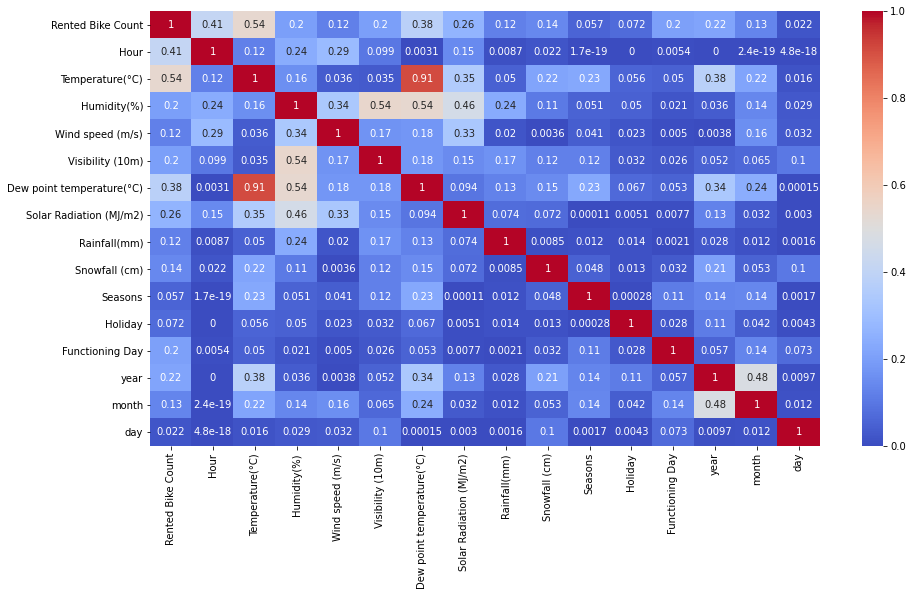

In [ ]:
## Correlation
plt.figure(figsize=(15,8))
correlation=dataset1.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

In [ ]:
dataset1.drop(['Dew point temperature(°C)',
 'Snowfall (cm)',
 'Wind speed (m/s)',
 'day',
 'month',
 'year'],axis=1, inplace=True)

In [ ]:
dataset1.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Seasons,Holiday,Functioning Day
0,254,0,-5.2,37,2000,0.0,0.0,2,1,1
1,204,1,-5.5,38,2000,0.0,0.0,2,1,1
2,173,2,-6.0,39,2000,0.0,0.0,2,1,1
3,107,3,-6.2,40,2000,0.0,0.0,2,1,1
4,78,4,-6.0,36,2000,0.0,0.0,2,1,1


# **Data Preparation**

In [ ]:
dataset1.shape

(8760, 10)

In [ ]:
dataset_pr=dataset1.copy()

In [ ]:
features1=dataset1.describe().columns

features1

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Visibility (10m)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)',
       'Seasons', 'Holiday', 'Functioning Day'],
      dtype='object')

In [ ]:
len(features1)

10

In [ ]:
X= dataset_pr[features1[1:]]
X.head()

,Hour,Temperature(°C),Humidity(%),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Seasons,Holiday,Functioning Day
0,0,-5.2,37,2000,0.0,0.0,2,1,1
1,1,-5.5,38,2000,0.0,0.0,2,1,1
2,2,-6.0,39,2000,0.0,0.0,2,1,1
3,3,-6.2,40,2000,0.0,0.0,2,1,1
4,4,-6.0,36,2000,0.0,0.0,2,1,1


In [ ]:
y = np.sqrt(dataset_pr[features1[0]])
y.head()

0    15.937377
1    14.282857
2    13.152946
3    10.344080
4     8.831761
Name: Rented Bike Count, dtype: float64

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=0)
print(X_train.shape)
print(X_test.shape)

(6132, 9)
(2628, 9)


# **Implementing Linear Regression**

In [ ]:
from sklearn.linear_model import LinearRegression
reg= LinearRegression().fit(X_train, y_train)

In [ ]:
reg.score(X_train, y_train)

0.6334749885336819

In [ ]:
reg.coef_

array([ 4.70899820e-01,  6.44922318e-01, -1.40171713e-01,  1.01669221e-03,
       -1.09857044e+00, -1.54653369e+00,  1.30456470e+00,  3.62584715e+00,
        2.70414432e+01])

In [ ]:
y_pred_train=reg.predict(X_train)
y_pred=reg.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error((y_train), (y_pred_train))
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_train, y_pred_train)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score(y_train, y_pred_train)
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score(y_train, y_pred_train))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 57.01388485097972
RMSE : 7.550753925998365
MAE : 5.82426896613067
R2 : 0.6334749885336819
Adjusted R2 : 0.63221497130557


In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error(y_test, y_pred)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_test, y_pred)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score((y_test), (y_pred))
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score((y_test), (y_pred)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 57.79693607750042
RMSE : 7.602429616740981
MAE : 5.880703788151969
R2 : 0.6237131747589355
Adjusted R2 : 0.622419598965517


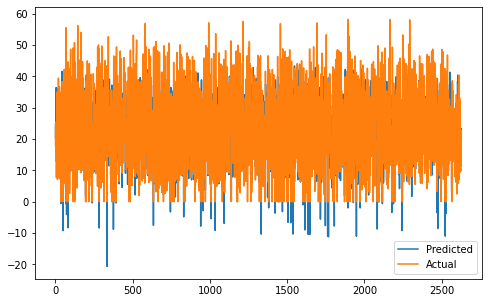

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(np.array(y_pred))
plt.plot(np.array((y_test)))
plt.legend(["Predicted","Actual"])
plt.show()

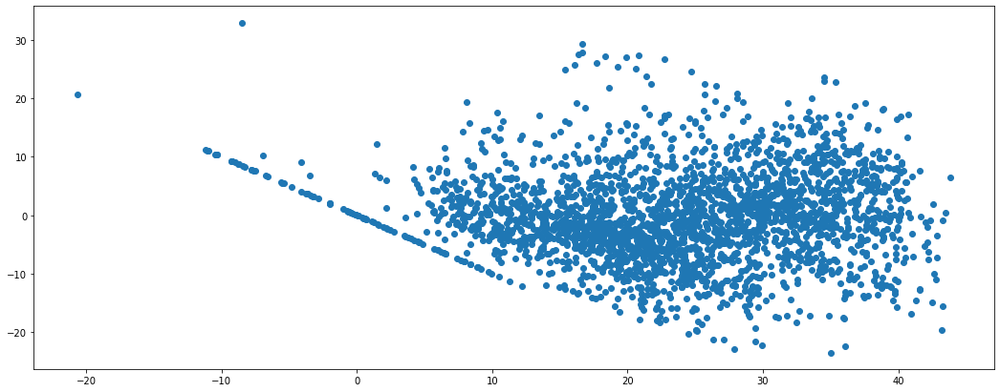

In [ ]:
### Heteroscadacity
plt.scatter((y_pred),(y_test)-(y_pred))

# **Implementing Lasso regression**

In [ ]:
from sklearn.linear_model import Lasso
lasso= Lasso(alpha=0.1, max_iter=3000)

lasso.fit(X_train,y_train)

Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=3000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [ ]:
lasso.score(X_train, y_train)

0.6297448696399118

In [ ]:
y_pred_train_l=lasso.predict(X_train)
y_pred_l=lasso.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error((y_train), (y_pred_train_l))
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_train, y_pred_train_l)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score(y_train, y_pred_train_l)
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score(y_train, y_pred_train_l))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 57.594114200783366
RMSE : 7.589078613427546
MAE : 5.86112981519809
R2 : 0.6297448696399117
Adjusted R2 : 0.6284720292376043


In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error(y_test, y_pred_l)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_test, y_pred_l)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score((y_test), (y_pred_l))
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score((y_test), (y_pred_l)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 57.86197448168322
RMSE : 7.606705888995789
MAE : 5.903113482365391
R2 : 0.6232897423715185
Adjusted R2 : 0.6219947109281814


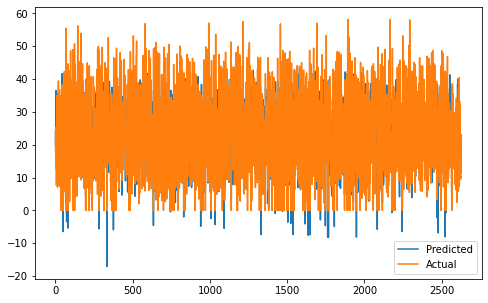

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(np.array(y_pred_l))
plt.plot(np.array((y_test)))
plt.legend(["Predicted","Actual"])
plt.show()

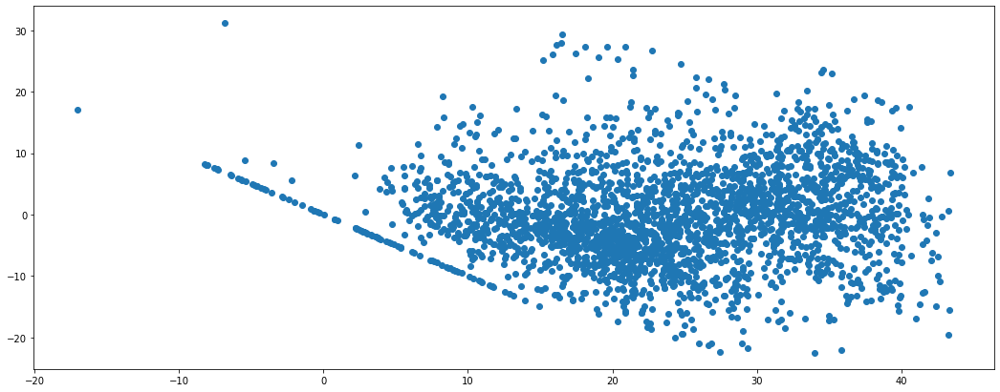

In [ ]:
### Heteroscadacity
plt.scatter((y_pred_l),(y_test-y_pred_l))

# **Implementing Ridge Regression**

In [ ]:
from sklearn.linear_model import Ridge

ridge= Ridge(alpha=0.1)

In [ ]:
ridge.fit(X_train,y_train)

Ridge(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [ ]:
ridge.score(X_train, y_train)

0.6334749473851724

In [ ]:
y_pred_train_r=ridge.predict(X_train)
y_pred_r=ridge.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error((y_train), (y_pred_train_r))
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_train, y_pred_train_r)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score(y_train, y_pred_train_r)
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score(y_train, y_pred_train_r))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 57.01389125173358
RMSE : 7.550754349847012
MAE : 5.82427110752822
R2 : 0.6334749473851724
Adjusted R2 : 0.6322149300156027


In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error(y_test, y_pred_r)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_test, y_pred_r)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score((y_test), (y_pred_r))
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score((y_test), (y_pred_r)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 57.79594966755792
RMSE : 7.602364741812768
MAE : 5.880681422085658
R2 : 0.6237195967786973
Adjusted R2 : 0.6224260430625048


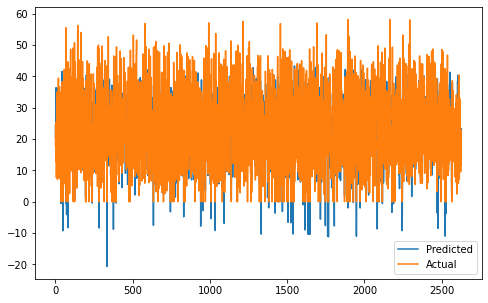

In [ ]:
plt.figure(figsize=(8,5))
plt.plot((y_pred_r))
plt.plot((np.array(y_test)))
plt.legend(["Predicted","Actual"])
plt.show()

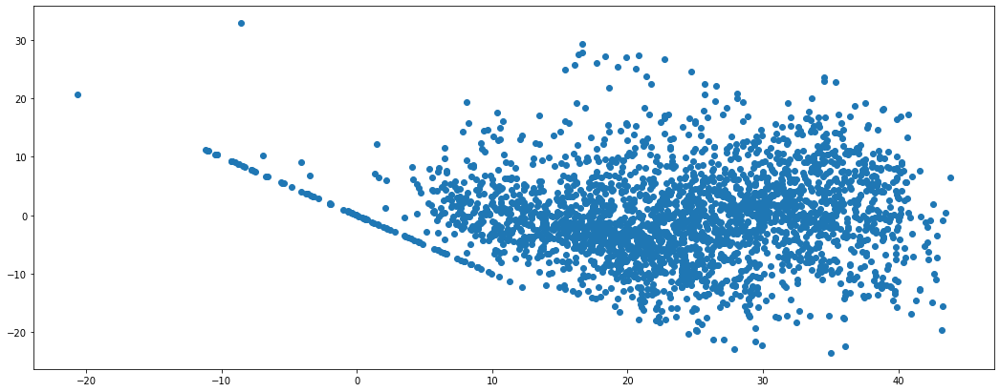

In [ ]:
### Heteroscadacity
plt.scatter((y_pred_r),(y_test)-(y_pred_r))

# **Implementing Elastic Net Regression**

In [ ]:
from sklearn.linear_model import ElasticNet
#a * L1 + b * L2
#alpha = a + b and l1_ratio = a / (a + b)
elasticnet = ElasticNet(alpha=0.1, l1_ratio=0.5)

In [ ]:
elasticnet.fit(X_train,y_train)

ElasticNet(alpha=0.1, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [ ]:
elasticnet.score(X_train, y_train)

0.5717095326213393

In [ ]:
y_pred_train_en=elasticnet.predict(X_train)
y_pred_en=elasticnet.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error((y_train), (y_pred_train_en))
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_train, y_pred_train_en)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score(y_train, y_pred_train_en)
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score(y_train, y_pred_train_en))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 66.62165643815331
RMSE : 8.162209041561807
MAE : 6.228634404920104
R2 : 0.5717095326213393
Adjusted R2 : 0.5702371818931468


In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error(y_test, y_pred_en)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_test, y_pred_en)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score((y_test), (y_pred_en))
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score((y_test), (y_pred_en)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 67.17767602505332
RMSE : 8.196198876616728
MAE : 6.2836301989098615
R2 : 0.5626398879579968
Adjusted R2 : 0.5611363581610609


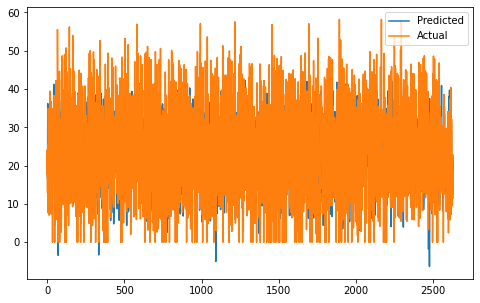

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(np.array(y_pred_en))
plt.plot((np.array(y_test)))
plt.legend(["Predicted","Actual"])
plt.show()

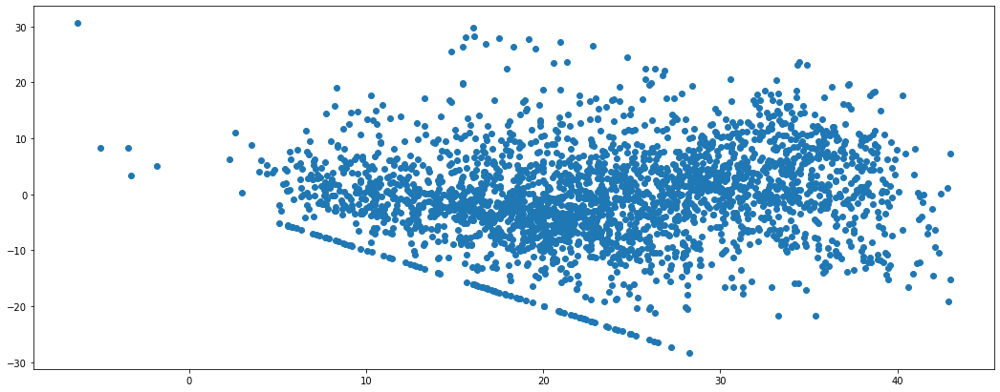

In [ ]:
### Heteroscadacity
plt.scatter((y_pred_en),(y_test)-(y_pred_en))

# **Implementing Decision Tree by  Using DecisionTreeRegressor**

In [ ]:
decision_regressor = DecisionTreeRegressor(criterion='mse', max_depth=8,
                      max_features=9, max_leaf_nodes=100,)
decision_regressor.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=8,
                      max_features=9, max_leaf_nodes=100,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [ ]:
y_pred_train_d = decision_regressor.predict(X_train)
y_pred_d = decision_regressor.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error
print("Model Score:",decision_regressor.score(X_train,y_train))

MSE= mean_squared_error(y_train, y_pred_train_d)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_train, y_pred_train_d)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score(y_train, y_pred_train_d)
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score(y_train, y_pred_train_d))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


Model Score: 0.8668051374836275
MSE : 20.71879494354339
RMSE : 4.5517903009193414
MAE : 3.2163583379184475
R2 : 0.8668051374836275
Adjusted R2 : 0.8663472483458707


In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error(y_test, y_pred_d)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_test, y_pred_d)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score((y_test), (y_pred_d))
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score((y_test), (y_pred_d)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 26.072031506670058
RMSE : 5.106077898609661
MAE : 3.551892552427489
R2 : 0.8302580962064353
Adjusted R2 : 0.8296745678893451


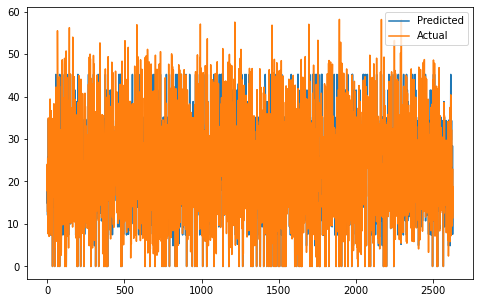

In [ ]:
plt.figure(figsize=(8,5))
plt.plot((np.array(y_pred_d)))
plt.plot(np.array((y_test)))
plt.legend(["Predicted","Actual"])
plt.show()

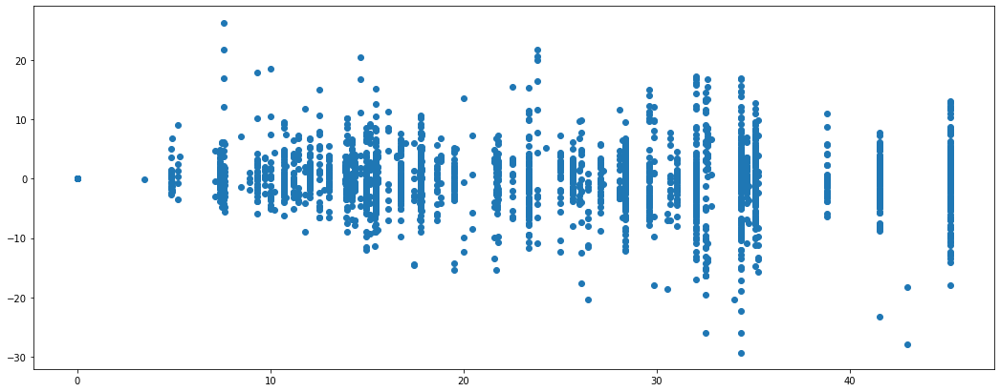

In [ ]:
### Heteroscadacity
plt.scatter((y_pred_d),(y_test)-(y_pred_d))

## **Visualizing Decision Tree**

In [ ]:
graph = Source(tree.export_graphviz(decision_regressor, out_file=None
   , feature_names=X_train.columns, class_names=['0', '1'] 
   , filled = True))
display(SVG(graph.pipe(format='svg')))

# **Implementing Random Forest Regressor**

In [ ]:
# Create an instance of the RandomForestRegressor
rf_model = RandomForestRegressor()

rf_model.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
# Making predictions on train and test data

y_pred_train = rf_model.predict(X_train)
y_pred = rf_model.predict(X_test)


In [ ]:
from sklearn.metrics import mean_squared_error
print("Model Score:",rf_model.score(X_train,y_train))

MSE= mean_squared_error(y_train, y_pred_train)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_train, y_pred_train)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score(y_train, y_pred_train)
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score(y_train, y_pred_train))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


Model Score: 0.9857262876628917
MSE : 2.220311755337553
RMSE : 1.4900710571437703
MAE : 1.0018502983562672
R2 : 0.9857262876628917
Adjusted R2 : 0.985677218369143


In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error(y_test, y_pred)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_test, y_pred)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score((y_test), (y_pred))
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score((y_test), (y_pred)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 16.42554913205281
RMSE : 4.0528445728960305
MAE : 2.7425537039832126
R2 : 0.8930614984944272
Adjusted R2 : 0.8926938718658748


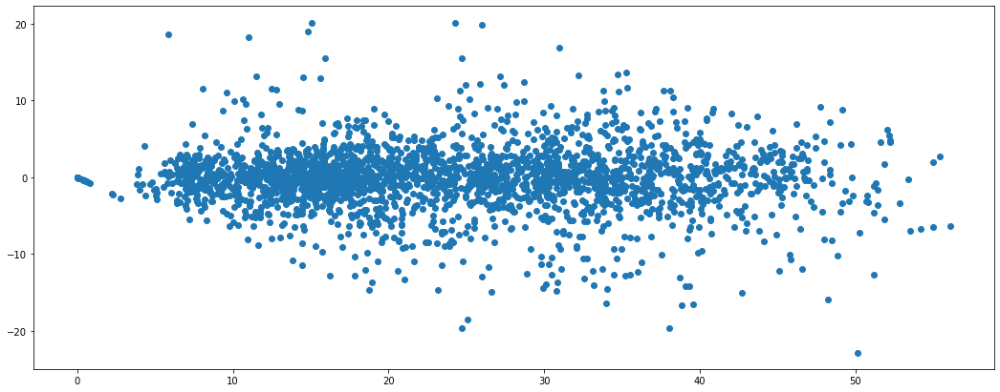

In [ ]:
### Heteroscadacity
plt.scatter((y_pred),(y_test)-(y_pred))

In [ ]:
rf_model.feature_importances_

array([0.23789681, 0.2926457 , 0.12671526, 0.02229368, 0.0483109 ,
       0.05781566, 0.05811658, 0.00291677, 0.15328865])

In [ ]:
importances = rf_model.feature_importances_

importance_dict = {'Feature' : list(X_train.columns),
                   'Feature Importance' : importances}

importance_df = pd.DataFrame(importance_dict)

In [ ]:
importance_df['Feature Importance'] = round(importance_df['Feature Importance'],2)

In [ ]:
importance_df.sort_values(by=['Feature Importance'],ascending=False)

,Feature,Feature Importance
1,Temperature(°C),0.29
0,Hour,0.24
8,Functioning Day,0.15
2,Humidity(%),0.13
5,Rainfall(mm),0.06
6,Seasons,0.06
4,Solar Radiation (MJ/m2),0.05
3,Visibility (10m),0.02
7,Holiday,0.00


In [ ]:
rf_model.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
features = X_train.columns
importances = rf_model.feature_importances_
indices = np.argsort(importances)

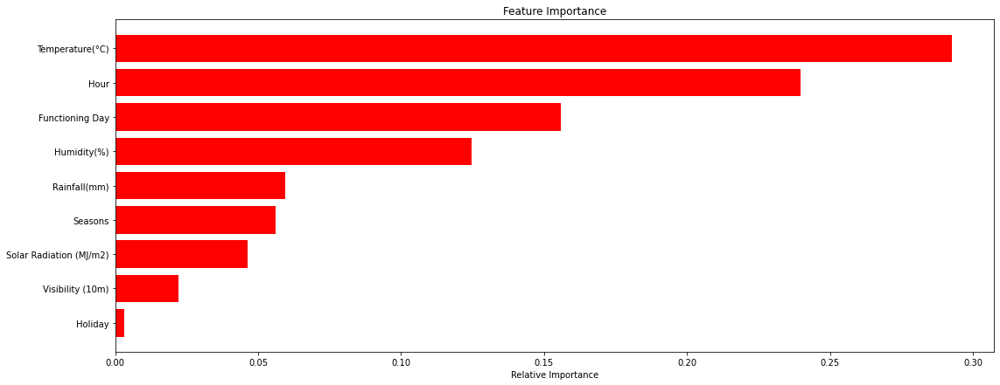

In [ ]:
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

# **Training a Random Forest Regressor with GridSearchCV**

In [ ]:
# Number of trees
n_estimators = [50,80,100]

# Maximum depth of trees
max_depth = [4,6,8]

# Minimum number of samples required to split a node
min_samples_split = [50,100,150]

# Minimum number of samples required at each leaf node
min_samples_leaf = [40,50]

# HYperparameter Grid
param_dict = {'n_estimators' : n_estimators,
              'max_depth' : max_depth,
              'min_samples_split' : min_samples_split,
              'min_samples_leaf' : min_samples_leaf}

In [ ]:
param_dict

{'max_depth': [4, 6, 8],
 'min_samples_leaf': [40, 50],
 'min_samples_split': [50, 100, 150],
 'n_estimators': [50, 80, 100]}

### **Importing Random Forest Regressor**

In [ ]:
# Create an instance of the RandomForestRegressor
rf_model = RandomForestRegressor()

# Grid search
rf_grid = GridSearchCV(estimator=rf_model,
                       param_grid = param_dict,
                       cv = 5, verbose=2)

rf_grid.fit(X_train,y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.3s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.3s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.3s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.3s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.3s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80 
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80, total=   0.5s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80 
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80, total=   0.5s
[CV] max_depth=4, min_samples_leaf=40, min_samples_s

[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:  2.5min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                             criterion='mse', max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             max_samples=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators=100, n_jobs=None,
                                             oob_score=False, random_state=None,
                                             verbose=0, warm_start=False),
             iid='deprecated', n_jo

In [ ]:
rf_grid.best_estimator_

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=8, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=40,
                      min_samples_split=50, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
rf_optimal_model = rf_grid.best_estimator_

In [ ]:
rf_grid.best_params_

{'max_depth': 8,
 'min_samples_leaf': 40,
 'min_samples_split': 50,
 'n_estimators': 100}

In [ ]:
# Making predictions on train and test data

y_pred_train_r_g = rf_optimal_model.predict(X_train)
y_pred_r_g = rf_optimal_model.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error
print("Model Score:",rf_optimal_model.score(X_train,y_train))

MSE= mean_squared_error(y_train, y_pred_train_r_g)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_train, y_pred_train_r_g)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score(y_train, y_pred_train_r_g)
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score(y_train, y_pred_train_r_g))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


Model Score: 0.8570213287385908
MSE : 22.24069093356587
RMSE : 4.716003703726903
MAE : 3.418251935063423
R2 : 0.8570213287385908
Adjusted R2 : 0.8565298054225661


In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error(y_test, y_pred_r_g)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_test, y_pred_r_g)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score((y_test), (y_pred_r_g))
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score((y_test), (y_pred_r_g)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 25.950427464575423
RMSE : 5.094156207319856
MAE : 3.6717830307687196
R2 : 0.8310497990550936
Adjusted R2 : 0.8304689924055504


In [ ]:
rf_optimal_model.feature_importances_

array([0.26795348, 0.31762496, 0.11658925, 0.00363483, 0.03263015,
       0.05768329, 0.06491417, 0.00055959, 0.13841028])

In [ ]:
importances = rf_optimal_model.feature_importances_

importance_dict = {'Feature' : list(X_train.columns),
                   'Feature Importance' : importances}

importance_df = pd.DataFrame(importance_dict)

In [ ]:
importance_df['Feature Importance'] = round(importance_df['Feature Importance'],2)

In [ ]:
importance_df.head()

,Feature,Feature Importance
0,Hour,0.27
1,Temperature(°C),0.32
2,Humidity(%),0.12
3,Visibility (10m),0.00
4,Solar Radiation (MJ/m2),0.03


In [ ]:
importance_df.sort_values(by=['Feature Importance'],ascending=False)

,Feature,Feature Importance
1,Temperature(°C),0.32
0,Hour,0.27
8,Functioning Day,0.14
2,Humidity(%),0.12
5,Rainfall(mm),0.06
6,Seasons,0.06
4,Solar Radiation (MJ/m2),0.03
3,Visibility (10m),0.00
7,Holiday,0.00


In [ ]:
rf_model.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
features = X_train.columns
importances = rf_model.feature_importances_
indices = np.argsort(importances)

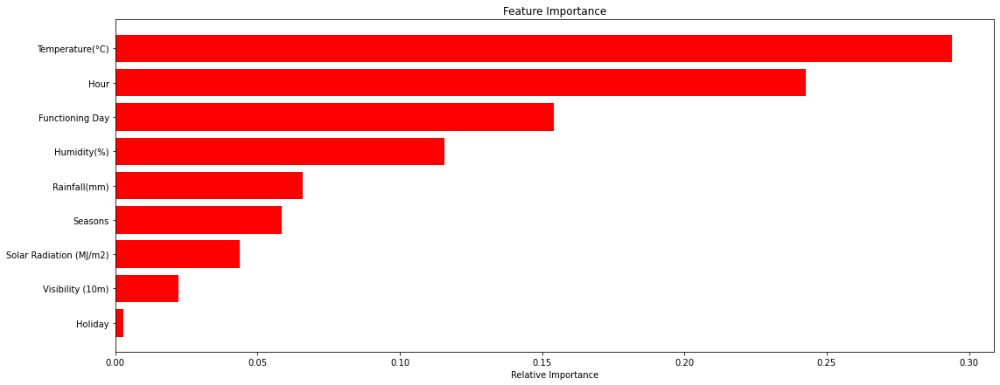

In [ ]:
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

# **Implementing Gradient Boosting Regressor**

In [ ]:
# Create an instance of the GradientBoostingRegressor
gb_model = GradientBoostingRegressor()


gb_model.fit(X_train,y_train)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [ ]:
# Making predictions on train and test data

y_pred_train = gb_model.predict(X_train)
y_pred = gb_model.predict(X_test)


In [ ]:
from sklearn.metrics import mean_squared_error
print("Model Score:",gb_model.score(X_train,y_train))
MSE= mean_squared_error(y_train, y_pred_train)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_train, y_pred_train)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score(y_train, y_pred_train)
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score(y_train, y_pred_train))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


Model Score: 0.8854484120234438
MSE : 17.81878682784633
RMSE : 4.221230487410789
MAE : 3.0407216817837943
R2 : 0.8854484120234437
Adjusted R2 : 0.885054613592661


In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error(y_test, y_pred)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_test, y_pred)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score((y_test), (y_pred))
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score((y_test), (y_pred)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 20.166419581951857
RMSE : 4.4907036844966575
MAE : 3.223205052853636
R2 : 0.8687065696562772
Adjusted R2 : 0.8682552171455463


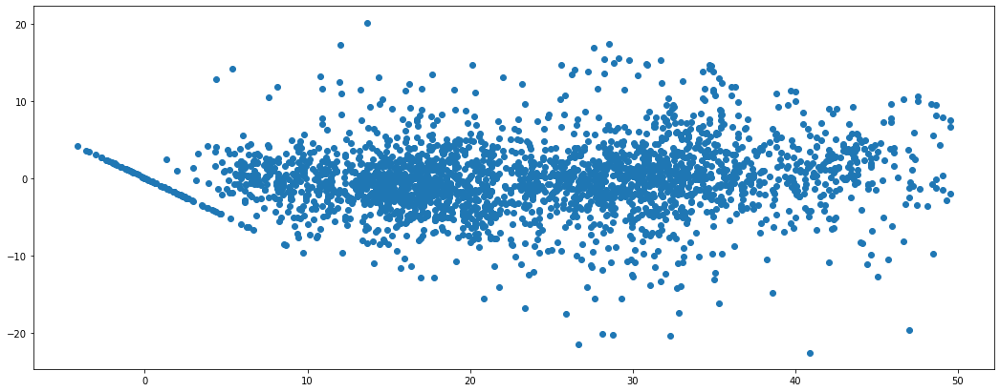

In [ ]:
### Heteroscadacity
plt.scatter((y_pred),(y_test)-(y_pred))

In [ ]:
gb_model.feature_importances_

array([0.25053473, 0.32363596, 0.10718793, 0.00180641, 0.02843996,
       0.06730833, 0.04441996, 0.00227043, 0.17439628])

In [ ]:
importances = gb_model.feature_importances_

importance_dict = {'Feature' : list(X_train.columns),
                   'Feature Importance' : importances}

importance_df = pd.DataFrame(importance_dict)

In [ ]:
importance_df['Feature Importance'] = round(importance_df['Feature Importance'],2)

In [ ]:
importance_df.head()

,Feature,Feature Importance
0,Hour,0.25
1,Temperature(°C),0.32
2,Humidity(%),0.11
3,Visibility (10m),0.00
4,Solar Radiation (MJ/m2),0.03


In [ ]:
importance_df.sort_values(by=['Feature Importance'],ascending=False)

,Feature,Feature Importance
1,Temperature(°C),0.32
0,Hour,0.25
8,Functioning Day,0.17
2,Humidity(%),0.11
5,Rainfall(mm),0.07
6,Seasons,0.04
4,Solar Radiation (MJ/m2),0.03
3,Visibility (10m),0.00
7,Holiday,0.00


In [ ]:
gb_model.fit(X_train,y_train)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [ ]:
features = X_train.columns
importances = gb_model.feature_importances_
indices = np.argsort(importances)

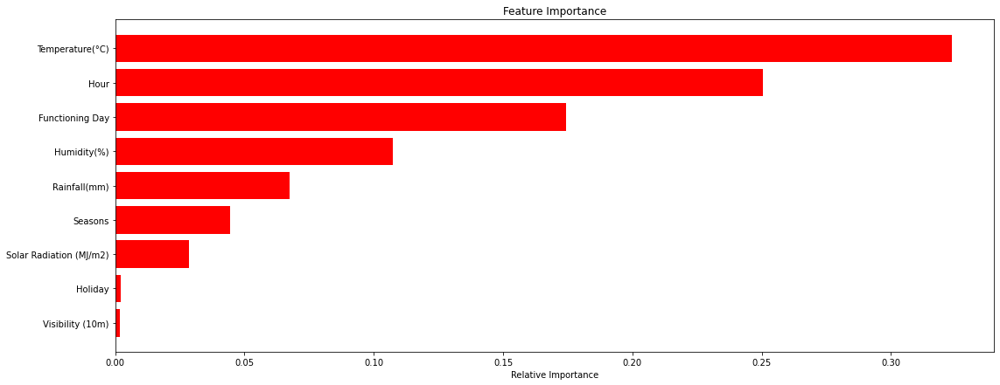

In [ ]:
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

# **Training a Gradient Boosting Regressor with GridSearchCV**

### **Provide the range of values for chosen hyperparameters**

In [ ]:
# Number of trees
n_estimators = [50,80,100]

# Maximum depth of trees
max_depth = [4,6,8]

# Minimum number of samples required to split a node
min_samples_split = [50,100,150]

# Minimum number of samples required at each leaf node
min_samples_leaf = [40,50]

# HYperparameter Grid
param_dict = {'n_estimators' : n_estimators,
              'max_depth' : max_depth,
              'min_samples_split' : min_samples_split,
              'min_samples_leaf' : min_samples_leaf}

In [ ]:
param_dict

{'max_depth': [4, 6, 8],
 'min_samples_leaf': [40, 50],
 'min_samples_split': [50, 100, 150],
 'n_estimators': [50, 80, 100]}

### **Importing Gradient Boosting Regressor**

In [ ]:
# Create an instance of the GradientBoostingRegressor
gb_model = GradientBoostingRegressor()

# Grid search
gb_grid = GridSearchCV(estimator=gb_model,
                       param_grid = param_dict,
                       cv = 5, verbose=2)

gb_grid.fit(X_train,y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.4s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.4s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.4s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.4s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.4s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80 
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80, total=   0.6s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80 
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80, total=   0.6s
[CV] max_depth=4, min_samples_leaf=40, min_samples_s

[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:  3.4min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                                 criterion='friedman_mse',
                                                 init=None, learning_rate=0.1,
                                                 loss='ls', max_depth=3,
                                                 max_features=None,
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100,
                                                 n_iter_n...e,
                          

In [ ]:
gb_grid.best_estimator_

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=8,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=40, min_samples_split=100,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [ ]:
gb_optimal_model = gb_grid.best_estimator_

In [ ]:
gb_grid.best_params_

{'max_depth': 8,
 'min_samples_leaf': 40,
 'min_samples_split': 100,
 'n_estimators': 100}

In [ ]:
# Making predictions on train and test data

y_pred_train_g_g = gb_optimal_model.predict(X_train)
y_pred_g_g= gb_optimal_model.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error
print("Model Score:",gb_optimal_model.score(X_train,y_train))
MSE= mean_squared_error(y_train, y_pred_train_g_g)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_train, y_pred_train_g_g)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score(y_train, y_pred_train_g_g)
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score(y_train, y_pred_train_g_g))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


Model Score: 0.9350134408967982
MSE : 10.108822267677137
RMSE : 3.179437413706572
MAE : 2.2184849811895013
R2 : 0.9350134408967982
Adjusted R2 : 0.934790034085519


In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error(y_test, y_pred_g_g)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_test, y_pred_g_g)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score((y_test), (y_pred_g_g))
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score((y_test), (y_pred_g_g)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 16.532416065047364
RMSE : 4.06600738625096
MAE : 2.789453912012844
R2 : 0.8923657415621592
Adjusted R2 : 0.8919957231030528


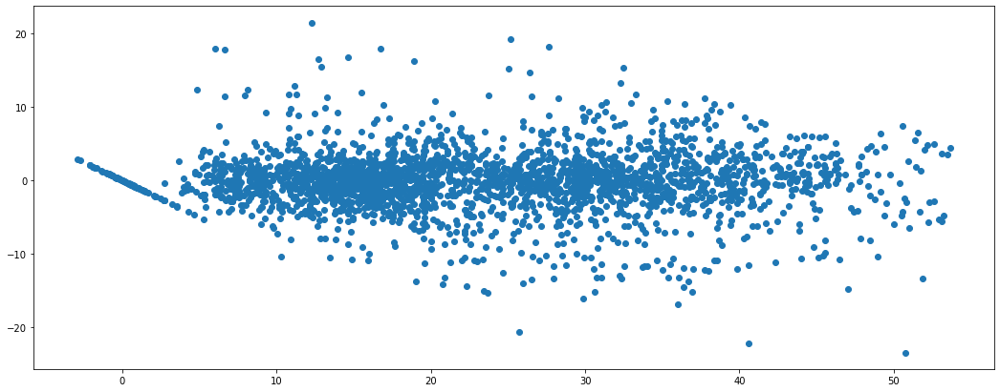

In [ ]:
### Heteroscadacity
plt.scatter((y_pred_g_g),(y_test)-(y_pred_g_g))

In [ ]:
gb_optimal_model.feature_importances_

array([0.24877402, 0.28881122, 0.12358316, 0.00826497, 0.03841998,
       0.06531655, 0.06486425, 0.00212147, 0.15984437])

In [ ]:
importances = gb_optimal_model.feature_importances_

importance_dict = {'Feature' : list(X_train.columns),
                   'Feature Importance' : importances}

importance_df = pd.DataFrame(importance_dict)

In [ ]:
importance_df['Feature Importance'] = round(importance_df['Feature Importance'],2)

In [ ]:
importance_df.head()

,Feature,Feature Importance
0,Hour,0.25
1,Temperature(°C),0.29
2,Humidity(%),0.12
3,Visibility (10m),0.01
4,Solar Radiation (MJ/m2),0.04


In [ ]:
importance_df.sort_values(by=['Feature Importance'],ascending=False)

,Feature,Feature Importance
1,Temperature(°C),0.29
0,Hour,0.25
8,Functioning Day,0.16
2,Humidity(%),0.12
5,Rainfall(mm),0.07
6,Seasons,0.06
4,Solar Radiation (MJ/m2),0.04
3,Visibility (10m),0.01
7,Holiday,0.00


In [ ]:
gb_model.fit(X_train,y_train)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [ ]:
features = X_train.columns
importances = gb_model.feature_importances_
indices = np.argsort(importances)

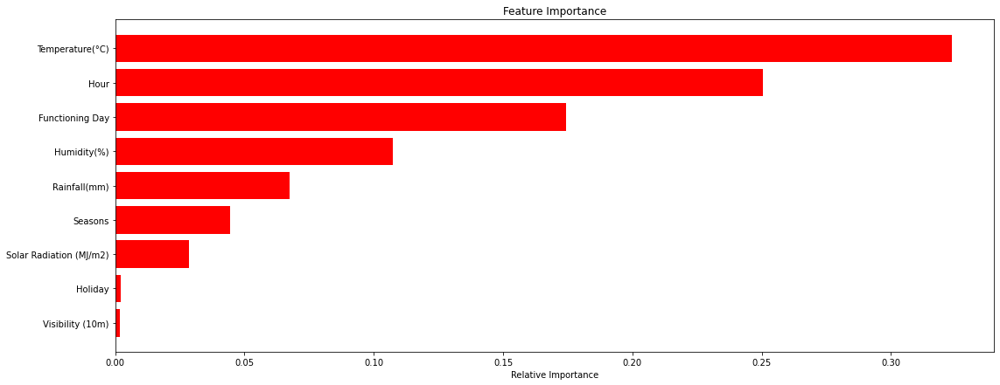

In [ ]:
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

# **Implementing XG Boost Regressor**

In [ ]:
# Create an instance of the RandomForestRegressor
xg_model = XGBRegressor()


xg_model.fit(X_train,y_train)

[18:30:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [ ]:
# Making predictions on train and test data

y_pred_train = xg_model.predict(X_train)
y_pred = xg_model.predict(X_test)


In [ ]:
from sklearn.metrics import mean_squared_error
print("Model Score:",gb_model.score(X_train,y_train))
MSE= mean_squared_error(y_train, y_pred_train)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_train, y_pred_train)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score(y_train, y_pred_train)
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score(y_train, y_pred_train))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


Model Score: 0.8854484120234438
MSE : 17.89065286419624
RMSE : 4.229734372770499
MAE : 3.0511424749252876
R2 : 0.8849864070247309
Adjusted R2 : 0.8845910203414697


In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error(y_test, y_pred)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_test, y_pred)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score((y_test), (y_pred))
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score((y_test), (y_pred)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 20.18841549690695
RMSE : 4.493152066968905
MAE : 3.23718889559389
R2 : 0.8685633653003296
Adjusted R2 : 0.8681115204904377


In [ ]:
xg_model.feature_importances_

array([0.09293612, 0.1535569 , 0.12244016, 0.00761385, 0.09507797,
       0.10900205, 0.07138177, 0.01542726, 0.3325639 ], dtype=float32)

In [ ]:
importances = xg_model.feature_importances_

importance_dict = {'Feature' : list(X_train.columns),
                   'Feature Importance' : importances}

importance_df = pd.DataFrame(importance_dict)

In [ ]:
importance_df['Feature Importance'] = round(importance_df['Feature Importance'],2)

In [ ]:
importance_df.sort_index()

,Feature,Feature Importance
0,Hour,0.09
1,Temperature(°C),0.15
2,Humidity(%),0.12
3,Visibility (10m),0.01
4,Solar Radiation (MJ/m2),0.10
5,Rainfall(mm),0.11
6,Seasons,0.07
7,Holiday,0.02
8,Functioning Day,0.33


In [ ]:
xg_model.fit(X_train,y_train)

[18:30:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [ ]:
features = X_train.columns
importances = xg_model.feature_importances_
indices = np.argsort(importances)

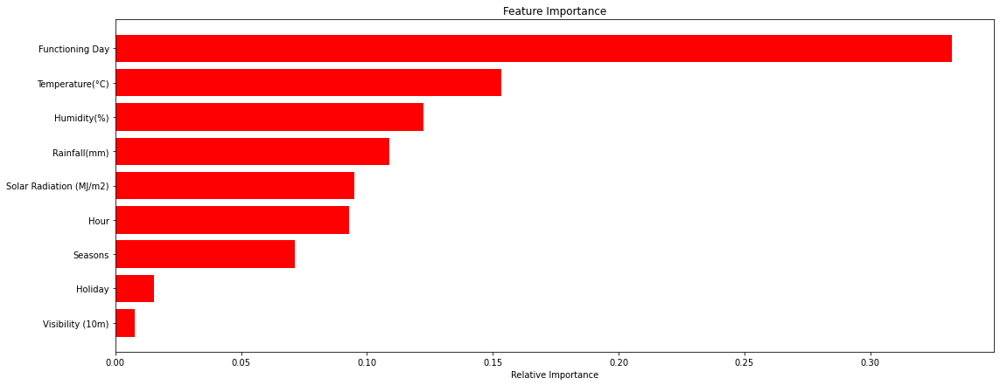

In [ ]:
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

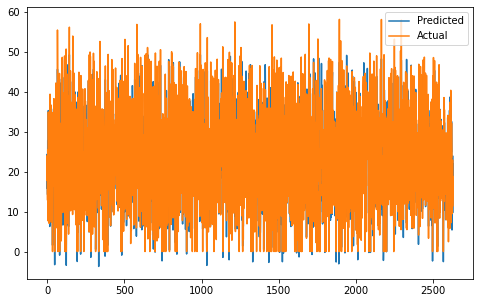

In [ ]:
plt.figure(figsize=(8,5))
plt.plot((y_pred))
plt.plot(np.array((y_test)))
plt.legend(["Predicted","Actual"])
plt.show()

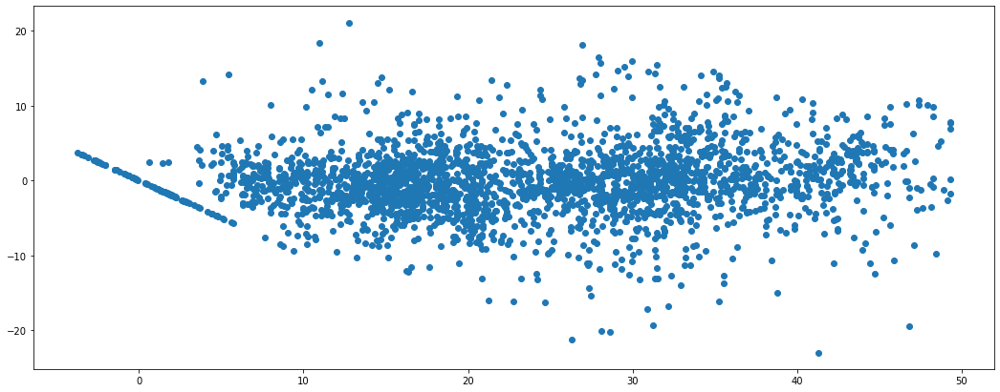

In [ ]:
### Heteroscadacity
plt.scatter((y_pred),(y_test)-(y_pred))

# **Training a XG Boost Regressor with GridSearchCV**

### **Provide the range of values for chosen hyperparameters**

In [ ]:
# Number of trees
n_estimators = [50,80,100]

# Maximum depth of trees
max_depth = [4,6,8]

# Minimum number of samples required to split a node
min_samples_split = [50,100,150]

# Minimum number of samples required at each leaf node
min_samples_leaf = [40,50]

# HYperparameter Grid
param_dict = {'n_estimators' : n_estimators,
              'max_depth' : max_depth,
              'min_samples_split' : min_samples_split,
              'min_samples_leaf' : min_samples_leaf}

In [ ]:
param_dict

{'max_depth': [4, 6, 8],
 'min_samples_leaf': [40, 50],
 'min_samples_split': [50, 100, 150],
 'n_estimators': [50, 80, 100]}

### **Importing XG Boost Regressor**

In [ ]:
# Create an instance of the XGBRegressor
xg_model = XGBRegressor()

# Grid search
xg_grid = GridSearchCV(estimator=xg_model,
                       param_grid = param_dict,
                       cv = 5, verbose=2)

xg_grid.fit(X_train,y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 
[18:30:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.2s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 
[18:30:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.2s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 
[18:30:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.2s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 
[18:30:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50, total=   0.2s
[CV] max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50 
[18:30:20] WARNING: /workspa

[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:  1.8min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                    colsample_bylevel=1, colsample_bynode=1,
                                    colsample_bytree=1, gamma=0,
                                    importance_type='gain', learning_rate=0.1,
                                    max_delta_step=0, max_depth=3,
                                    min_child_weight=1, missing=None,
                                    n_estimators=100, n_jobs=1, nthread=None,
                                    objective='reg:linear', random_state=0,
                                    reg_alpha=0, reg_lambda=1,
                                    scale_pos_weight=1, seed=None, silent=None,
                                    subsample=1, verbosity=1),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': [4, 6, 8], 'min_samples_leaf': [40, 50],
                         'min_samples_split': [50, 10

In [ ]:
xg_grid.best_estimator_

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=8, min_child_weight=1, min_samples_leaf=40,
             min_samples_split=50, missing=None, n_estimators=80, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
             subsample=1, verbosity=1)

In [ ]:
xg_optimal_model = xg_grid.best_estimator_

In [ ]:
xg_grid.best_params_

{'max_depth': 8,
 'min_samples_leaf': 40,
 'min_samples_split': 50,
 'n_estimators': 80}

In [ ]:
# Making predictions on train and test data

y_pred_train_x_g = xg_optimal_model.predict(X_train)
y_pred_x_g  = xg_optimal_model.predict(X_test)


In [ ]:
from sklearn.metrics import mean_squared_error
print("Model Score:",xg_optimal_model.score(X_train,y_train))
MSE= mean_squared_error(y_train, y_pred_train_x_g)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_train, y_pred_train_x_g)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score(y_train, y_pred_train_x_g)
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score(y_train, y_pred_train_x_g))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


Model Score: 0.9668007464593723
MSE : 5.164227158554409
RMSE : 2.27249359923288
MAE : 1.5992926315221427
R2 : 0.9668007464593723
Adjusted R2 : 0.9666866160996069


In [ ]:
from sklearn.metrics import mean_squared_error
MSE= mean_squared_error(y_test, y_pred_x_g)
print("MSE :",MSE)

RMSE=np.sqrt(MSE)
print("RMSE :",RMSE)


MAE= mean_absolute_error(y_test, y_pred_x_g)
print("MAE :",MAE)


from sklearn.metrics import r2_score
r2= r2_score((y_test), (y_pred_x_g))
print("R2 :",r2)
print("Adjusted R2 :",1-(1-r2_score((y_test), (y_pred_x_g)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) )


MSE : 16.26765784833295
RMSE : 4.033318466019383
MAE : 2.727763409019645
R2 : 0.8940894493498932
Adjusted R2 : 0.893725356547811


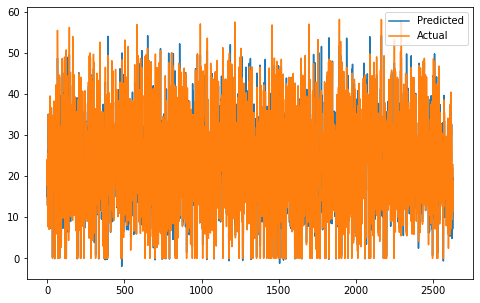

In [ ]:
plt.figure(figsize=(8,5))
plt.plot((y_pred_x_g))
plt.plot(np.array((y_test)))
plt.legend(["Predicted","Actual"])
plt.show()

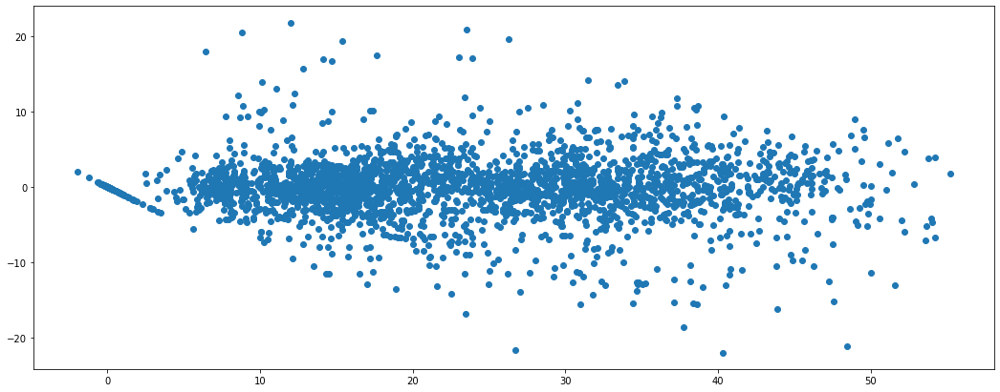

In [ ]:
### Heteroscadacity
plt.scatter((y_pred_x_g),(y_test)-(y_pred_x_g))

In [ ]:
xg_optimal_model.feature_importances_

array([0.07488889, 0.06304894, 0.04126399, 0.00492741, 0.02499959,
       0.08971389, 0.08922318, 0.01080288, 0.60113126], dtype=float32)

In [ ]:
importances = xg_optimal_model.feature_importances_

importance_dict = {'Feature' : list(X_train.columns),
                   'Feature Importance' : importances}

importance_df = pd.DataFrame(importance_dict)

In [ ]:
importance_df['Feature Importance'] = round(importance_df['Feature Importance'],2)

In [ ]:
importance_df.head()

,Feature,Feature Importance
0,Hour,0.07
1,Temperature(°C),0.06
2,Humidity(%),0.04
3,Visibility (10m),0.00
4,Solar Radiation (MJ/m2),0.02


In [ ]:
importance_df.sort_values(by=['Feature Importance'],ascending=False)

,Feature,Feature Importance
8,Functioning Day,0.60
5,Rainfall(mm),0.09
6,Seasons,0.09
0,Hour,0.07
1,Temperature(°C),0.06
2,Humidity(%),0.04
4,Solar Radiation (MJ/m2),0.02
7,Holiday,0.01
3,Visibility (10m),0.00


In [ ]:
xg_model.fit(X_train,y_train)

[18:32:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [ ]:
features = X_train.columns
importances = xg_model.feature_importances_
indices = np.argsort(importances)

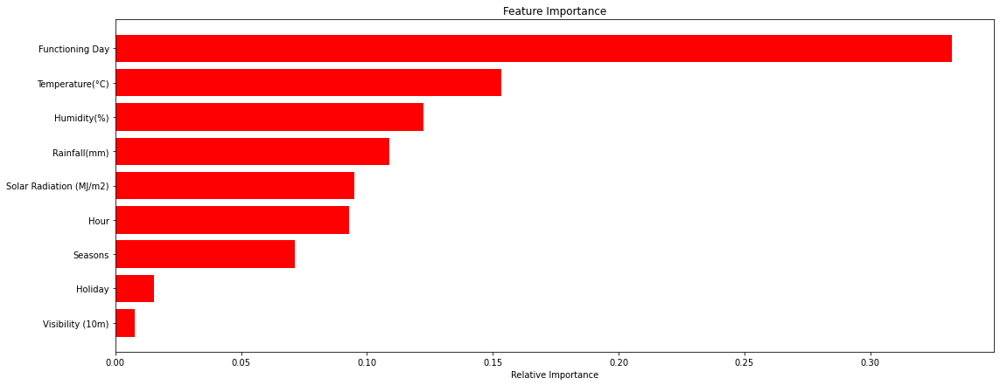

In [ ]:
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

# **Linear Regression  using Statsmodels**

In [ ]:

X = sm.add_constant(X) 

model = sm.OLS(y, X).fit()
predictions = model.predict(X) 

print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:      Rented Bike Count   R-squared:                       0.631
Model:                            OLS   Adj. R-squared:                  0.630
Method:                 Least Squares   F-statistic:                     1661.
Date:                Wed, 14 Apr 2021   Prob (F-statistic):               0.00
Time:                        18:32:08   Log-Likelihood:                -30156.
No. Observations:                8760   AIC:                         6.033e+04
Df Residuals:                    8750   BIC:                         6.040e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     